# Data Preparation

In [1]:
!pip install catboost
# Core scientific stack
!pip install numpy pandas scipy scikit-learn imbalanced-learn
# Visualization
!pip install matplotlib seaborn plotly yellowbrick
# Gradient boosting libraries
!pip install xgboost lightgbm catboost
# Deep learning frameworks
!pip install tensorflow torch
# NLP / Sentiment
!pip install textblob nltk gensim transformers
# Utilities & experiment tracking
!pip install joblib mlflow optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.4/208.4 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.

In [2]:
# Core
import numpy as np
import pandas as pd
import scipy as sp

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import yellowbrick

# Preprocessing & Utilities
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Classification & Regression Models
from sklearn.linear_model import LogisticRegression, Ridge, LinearRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from xgboost import XGBClassifier, XGBRegressor
import lightgbm as lgb
import catboost as cb

# Metrics
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, classification_report,
    mean_squared_error, mean_absolute_error, r2_score,
    confusion_matrix, roc_curve
)

# Deep Learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Embedding, Flatten
import torch
import torch.nn as nn
import torch.optim as optim

# NLP / Sentiment
from textblob import TextBlob
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from gensim.models import Word2Vec, Doc2Vec
from transformers import pipeline, AutoTokenizer, AutoModel

# Utilities
import joblib
import mlflow
import optuna


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [3]:
# TMDB Brand Colors (official palette)
TMDB_PRIMARY   = "#0D253F"   # Dark blue
TMDB_SECONDARY = "#01B4E4"   # Light blue
TMDB_TERTIARY  = "#90CEA1"   # Light green
TMDB_WHITE     = "#FFFFFF"
TMDB_GRAY      = "#C0C0C0"

ACCENT_ORANGE  = "#E67E22"
ACCENT_PURPLE  = "#9B59B6"
ACCENT_RED     = "#E74C3C"
ACCENT_YELLOW  = "#F1C40F"

PALETTE = [
    TMDB_SECONDARY, TMDB_TERTIARY, ACCENT_ORANGE,
    ACCENT_PURPLE, ACCENT_RED, ACCENT_YELLOW
]

# 1. Seaborn style with TMDB colors
sns.set_style("darkgrid", {
    "axes.facecolor": TMDB_PRIMARY,
    "figure.facecolor": TMDB_PRIMARY,
    "grid.color": "#1C3A57",
    "axes.edgecolor": "#333333",
    "text.color": TMDB_WHITE,
    "xtick.color": TMDB_GRAY,
    "ytick.color": TMDB_GRAY,
    "axes.labelcolor": TMDB_WHITE,
})

# 2. Global Matplotlib Params
plt.rcParams.update({
    "figure.facecolor": TMDB_PRIMARY,
    "axes.titlecolor": TMDB_SECONDARY,   # highlight titles in light blue
    "axes.titleweight": "bold",
    "legend.facecolor": TMDB_PRIMARY,
    "legend.edgecolor": "#333333",
    "font.family": "DejaVu Sans",
})

# 3. Colab backend respect
%config InlineBackend.print_figure_kwargs = {'facecolor' : TMDB_PRIMARY}
%config InlineBackend.figure_format = 'retina'

print("🎬 TMDB theme fully locked and loaded with dark blue, light blue, and light green.")


🎬 TMDB theme fully locked and loaded with dark blue, light blue, and light green.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Read raw lines to see what's wrong on that line
with open('/content/drive/MyDrive/kaggle_datasets/TMDB_purified_partial.csv', encoding='latin-1') as f:
    lines = f.readlines()

print(lines[0])        # header
print(lines[412257])   # problem row (0-indexed)

id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords,director,actors,popularity_norm,vote_count_norm,budget_norm,revenue_norm,popularity_std,vote_count_std,budget_std,revenue_std,log_revenue,log_budget,overview_tokens,tagline_tokens,features,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,valence,arousal,dominance,ROI,release_year,release_quarter,genre_count

103103.0,T27205.0,Inception,8.364,34495.0,Released,2010-07-15,825532764.0,148.0,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,160000000.0,https://www.warnerbros.com/movies/inception,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: ""ince

In [ ]:
import pandas as pd

path = '/content/drive/MyDrive/kaggle_datasets/TMDB_purified_partial.csv'

# Load with the tolerant options that work
df = pd.read_csv(
    path,
    low_memory=False,
    on_bad_lines='skip',
    quoting=3,
    escapechar='\\',
    encoding='latin-1'
)
print(f"Loaded: {df.shape}")

# Re-save with proper quoting so normal pd.read_csv() works from now on
df.to_csv(
    path,
    index=False,
    encoding='utf-8',
    quoting=1   # QUOTE_ALL — wraps every field in quotes, internal commas are safe
)
print("Re-saved with proper quoting.")

Loaded: (568867, 56)


In [ ]:
movies

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,fear.1,joy.1,negative.1,positive.1,sadness.1,surprise.1,trust.1,valence.1,arousal.1,dominance.1
0,27205.0,Inception,8.364,34495.0,Released,2010-07-15,8.255328e+08,148.0,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,0.028789,0.023053,0.210526,0.105263,0.048526,0.059211,0.000000,0.144600,0.025900,0.246700
1,157336.0,Interstellar,8.417,32571.0,Released,2014-11-05,7.017292e+08,169.0,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,0.030077,0.067615,0.000000,0.076923,0.000000,0.000000,0.053462,0.273167,0.120222,0.159667
2,155.0,The Dark Knight,8.512,30619.0,Released,2008-07-16,1.004558e+09,152.0,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,0.275308,0.031846,0.291667,0.291667,0.043885,0.018923,0.081769,-0.034710,0.173161,0.128548
3,19995.0,Avatar,7.573,29815.0,Released,2009-12-15,2.923706e+09,162.0,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,0.042200,0.037500,0.200000,0.300000,0.071000,0.043800,0.171000,0.187818,-0.108727,0.285818
4,24428.0,The Avengers,7.710,29166.0,Released,2012-04-25,1.518816e+09,143.0,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,0.118286,0.009667,0.190476,0.238095,0.055429,0.072524,0.052810,0.122308,0.067154,0.209038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
691929,54290.0,Tom Jobim: Águas de Março,0.000,0.0,Released,2002-12-31,0.000000e+00,108.0,False,NaN,...,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.102200,-0.108900,-0.018400
691930,870542.0,Suzanne's Hypnosis,0.000,0.0,Released,1997-01-31,0.000000e+00,48.0,False,NaN,...,0.106200,0.000000,0.250000,0.000000,0.229000,0.000000,0.000000,-0.201143,-0.090571,-0.078857
691931,870544.0,Michael Caine: Breaking the Mold,0.000,0.0,Released,1994-02-01,0.000000e+00,61.0,False,NaN,...,0.022500,0.121375,0.000000,0.142857,0.000000,0.000000,0.093750,0.430750,-0.111500,0.151750
691932,870548.0,Mujeres perdidas,0.000,0.0,Released,1964-08-13,0.000000e+00,79.0,False,NaN,...,0.000000,0.106200,0.400000,0.300000,0.059700,0.017200,0.075800,0.073308,0.047692,-0.021000


In [ ]:
movies.columns

Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages',
       'keywords', 'director', 'actors', 'buget', 'popularity_norm',
       'vote_count_norm', 'budget_norm', 'revenue_norm', 'popularity_std',
       'vote_count_std', 'budget_std', 'revenue_std', 'log_revenue',
       'log_budget', 'overview_tokens', 'tagline_tokens', 'features', 'anger',
       'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive',
       'sadness', 'surprise', 'trust', 'valence', 'arousal', 'dominance',
       'ROI', 'release_year', 'release_quarter', 'genre_count', 'anger.1',
       'anticipation.1', 'disgust.1', 'fear.1', 'joy.1', 'negative.1',
       'positive.1', 'sadness.1', 'surprise.1', 'trust.1', 

# Data Cleaning

In [ ]:
df = movies.copy()

In [ ]:
# Count rows with non-null directors
director_count = df[df['director'].notna()].shape[0]
actor_count    = df[df['actors'].notna()].shape[0]

print(f"🎬 Total movies with directors: {director_count}")
print(f"🎭 Total movies with actors: {actor_count}")


🎬 Total movies with directors: 449010
🎭 Total movies with actors: 428953


## 1. Handle Missing Data

In [ ]:
df['budget']= df['budget'].fillna(0)
df['revenue']= df['revenue'].fillna(0)
df['runtime']= df['runtime'].fillna(df['runtime'].median())
df['overview']= df['overview'].fillna("No overview available")
df['tagline'] = df['tagline'].fillna("No tagline available")

### Drop row missing critical identifiers

In [ ]:
df = df.dropna(subset=['title', 'release_date'])

## 2. Datatype Conversion

In [ ]:
df['release_date'] = pd.to_datetime(df['release_date'], errors = 'coerce')
numeric_cols = ['budget', 'revenue', 'runtime', 'popularity', 'vote_average', 'vote_count']
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

## 3. Drop Duplicated

In [ ]:
df = df.drop_duplicates(subset=['id'])

## 4. Outlier Detection (basic filtering)

In [ ]:
df = df[(df['runtime'] > 10) & (df['runtime'] < 500)]
df = df[(df['budget'] >= 0) & (df['revenue'] >= 0)]

## 5. Standardization & Normalization

### MinMaxScaler for recommendation system (values between 0 and 1)

In [ ]:
scaler = MinMaxScaler()
df[['popularity_norm', 'vote_count_norm', 'budget_norm', 'revenue_norm']] = scaler.fit_transform(df[['popularity', 'vote_count', 'budget', 'revenue']])

###  StandardScaler for ML models (mean=0, std=1)

In [ ]:
std_scaler = StandardScaler()
df[['popularity_std', 'vote_count_std', 'budget_std', 'revenue_std']] = std_scaler.fit_transform(df[['popularity', 'vote_count', 'budget', 'revenue']])

### Log transform skewed distributions (budget & revenue)

In [ ]:
df['log_revenue'] = np.log1p(df['revenue'])
df['log_budget'] = np.log1p(df['budget'])

## 6. Text Preprocessing

In [ ]:
!cp /content/NRC-Emotion-Intensity-Lexicon-v1.txt /content/drive/MyDrive/kaggle_datasets/NRC-Emotion-Intensity-Lexicon-v1.txt
!cp /content/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt /content/drive/MyDrive/kaggle_datasets/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt
!cp /content/NRC-VAD-Lexicon-v2.1.txt /content/drive/MyDrive/kaggle_datasets/NRC-VAD-Lexicon-v2.1.txt



cp: cannot stat '/content/NRC-Emotion-Intensity-Lexicon-v1.txt': No such file or directory
cp: cannot stat '/content/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt': No such file or directory
cp: cannot stat '/content/NRC-VAD-Lexicon-v2.1.txt': No such file or directory


In [ ]:
base_path = "/content/drive/MyDrive/kaggle_datasets/"

# EmoLex
emolex = pd.read_csv(
    base_path + "NRC-Emotion-Lexicon-Wordlevel-v0.92.txt",
    sep='\t',
    names=["word","emotion","association"]
)
emolex_dict = emolex.pivot(index="word", columns="emotion", values="association").fillna(0).to_dict("index")

# Emotion Intensity (English-only v1 file)
intensity = pd.read_csv(
    base_path + "NRC-Emotion-Intensity-Lexicon-v1.txt",
    sep='\t',
    names=["word","emotion","score"],
    dtype={"word":str, "emotion":str, "score":float}
)
intensity_dict = intensity.pivot(index="word", columns="emotion", values="score").fillna(0).to_dict("index")

# VAD
vad = pd.read_csv(base_path + "NRC-VAD-Lexicon-v2.1.txt", sep='\t')
vad_dict = vad.set_index("term")[["valence","arousal","dominance"]].to_dict("index")

In [ ]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [ ]:
def clean_text(text, keep_digits=False):
    text = text.lower()
    text = re.sub(r'[^a-zA-Z0-9\s]' if keep_digits else r'[^a-zA-Z\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(w) for w in tokens if w not in stop_words]
    return tokens

In [ ]:
df['overview_tokens'] = df['overview'].apply(lambda x: clean_text(str(x)))
df['tagline_tokens'] = df['tagline'].apply(lambda x: clean_text(str(x)))

### Sentiment analysis

In [ ]:
# Lexicon feature lookup
def get_features(tokens):
    features = []
    for w in tokens:
        emo = emolex_dict.get(w, {})
        inten = intensity_dict.get(w, {})
        vad_vals = vad_dict.get(w, {})
        combined = {**emo, **inten, **vad_vals}
        if combined:
            features.append(combined)
    if not features:
        return {}
    return pd.DataFrame(features).mean().to_dict()

# Apply to overview tokens
df['features'] = df['overview_tokens'].apply(get_features)

# Expand into columns
features_df = pd.json_normalize(df['features'])
df_final = pd.concat([df, features_df], axis=1)

## 8. Feature Engineering

In [ ]:
df_final['ROI'] = df_final.apply(lambda row: row['revenue']/row['budget'] if row['budget'] > 0 else 0,axis=1)
df_final = df_final[df_final['release_year'] <= 2026]
df_final['release_year'] = df_final['release_date'].dt.year
df_final['release_quarter'] = df_final['release_date'].dt.quarter
df_final['genre_count'] = df_final['genres'].apply(lambda x: len(str(x).split(',')) if pd.notnull(x) else 0)

## 9. Consistency Checks

In [ ]:
df_final = df_final[df_final['vote_average'].between(0, 10)]

## Overally

In [ ]:
df_final.to_csv('/content/drive/MyDrive/kaggle_datasets/TMDB_movie_dataset_v11_full.csv', index=False)
print("Final dataset saved with emotional features and cleaned metadata.")

Final dataset saved with emotional features and cleaned metadata.


In [ ]:
movies = pd.read_csv('/content/drive/MyDrive/kaggle_datasets/TMDB_movie_dataset_v11_full.csv')
print(movies.columns)


/tmp/ipykernel_687/4078421961.py:1: DtypeWarning: Columns (24,25) have mixed types. Specify dtype option on import or set low_memory=False.
  movies = pd.read_csv('/content/drive/MyDrive/kaggle_datasets/TMDB_movie_dataset_v11_full.csv')


Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages',
       'keywords', 'director', 'actors', 'popularity_norm', 'vote_count_norm',
       'budget_norm', 'revenue_norm', 'popularity_std', 'vote_count_std',
       'budget_std', 'revenue_std', 'log_revenue', 'log_budget',
       'overview_tokens', 'tagline_tokens', 'features', 'anger',
       'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive',
       'sadness', 'surprise', 'trust', 'valence', 'arousal', 'dominance',
       'ROI', 'release_year', 'release_quarter', 'genre_count'],
      dtype='object')


In [ ]:
import pandas as pd
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to your full dataset
full_path = '/content/drive/MyDrive/kaggle_datasets/TMDB_movie_dataset_v11_full.csv'

# Load dataset
movies = pd.read_csv(full_path, low_memory=False)

# Drop typo column if present
if 'buget' in movies.columns:
    movies = movies.drop(columns=['buget'])

# Fill missing values in budget
movies['budget'] = movies['budget'].fillna(0)

# Remove duplicated columns by name (keep first occurrence)
movies = movies.loc[:, ~movies.columns.duplicated()]

# Extra step: drop any columns with suffixes like .1, .2
movies = movies[[col for col in movies.columns if not col.endswith(('.1','.2'))]]

# Save back to the same file (overwrite)
movies.to_csv(full_path, index=False)

print("✅ Cleaned: dropped 'buget', filled 'budget', removed .1/.2 duplicates, and overwritten full.csv")
print("Unique column count:", len(movies.columns))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Cleaned: dropped 'buget', filled 'budget', removed .1/.2 duplicates, and overwritten full.csv
Unique column count: 56


# Exploratory Data Analysis

## Distribution of Core Movie Features

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import pandas as pd
movies = pd.read_csv('/content/drive/MyDrive/kaggle_datasets/TMDB_purified_local.csv')
print(movies.columns)

/tmp/ipykernel_30991/3138535057.py:2: DtypeWarning: Columns (24,25) have mixed types. Specify dtype option on import or set low_memory=False.
  movies = pd.read_csv('/content/drive/MyDrive/kaggle_datasets/TMDB_purified_local.csv')


Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages',
       'keywords', 'director', 'actors', 'popularity_norm', 'vote_count_norm',
       'budget_norm', 'revenue_norm', 'popularity_std', 'vote_count_std',
       'budget_std', 'revenue_std', 'log_revenue', 'log_budget',
       'overview_tokens', 'tagline_tokens', 'features', 'anger',
       'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive',
       'sadness', 'surprise', 'trust', 'valence', 'arousal', 'dominance',
       'ROI', 'release_year', 'release_quarter', 'genre_count'],
      dtype='object')


In [6]:
movies = movies[movies['adult'] == False].reset_index(drop=True)
print(f"Remaining rows: {len(movies):,}")

Remaining rows: 578,965


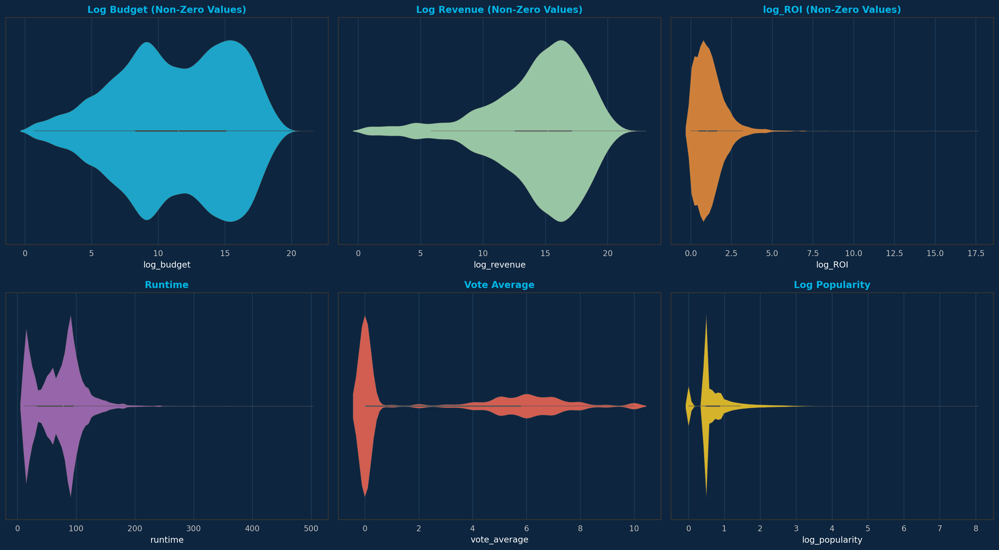

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18,10))

# Violin plot for Log Budget (non-zero)
sns.violinplot(x=movies[movies['log_budget'] > 0]['log_budget'],
               color=TMDB_SECONDARY, ax=axes[0,0],inner="box")
axes[0,0].set_title('Log Budget (Non-Zero Values)')

# Violin plot for Log Revenue (non-zero)
sns.violinplot(x=movies[movies['log_revenue'] > 0]['log_revenue'],
               color=TMDB_TERTIARY, ax=axes[0,1],inner="box")
axes[0,1].set_title('Log Revenue (Non-Zero Values)')

# Violin plot for log_ROI (non-zero)
movies['log_ROI'] = np.log1p(movies['ROI'])
sns.violinplot(x=movies[movies['log_ROI'] > 0]['log_ROI'],
               color=ACCENT_ORANGE, ax=axes[0,2],inner="box")
axes[0,2].set_title('log_ROI (Non-Zero Values)')

# Violin plot for Runtime
sns.violinplot(x=movies['runtime'], color=ACCENT_PURPLE, ax=axes[1,0],inner="box")
axes[1,0].set_title('Runtime')

# Violin plot for Vote Average
sns.violinplot(x=movies['vote_average'], color=ACCENT_RED, ax=axes[1,1],inner="box")
axes[1,1].set_title('Vote Average')

# Violin plot for log-transformed Popularity
movies['log_popularity'] = np.log1p(movies['popularity'])
sns.violinplot(x=movies['log_popularity'], color=ACCENT_YELLOW, ax=axes[1,2],inner="box")
axes[1,2].set_title('Log Popularity')

plt.tight_layout()
plt.show()


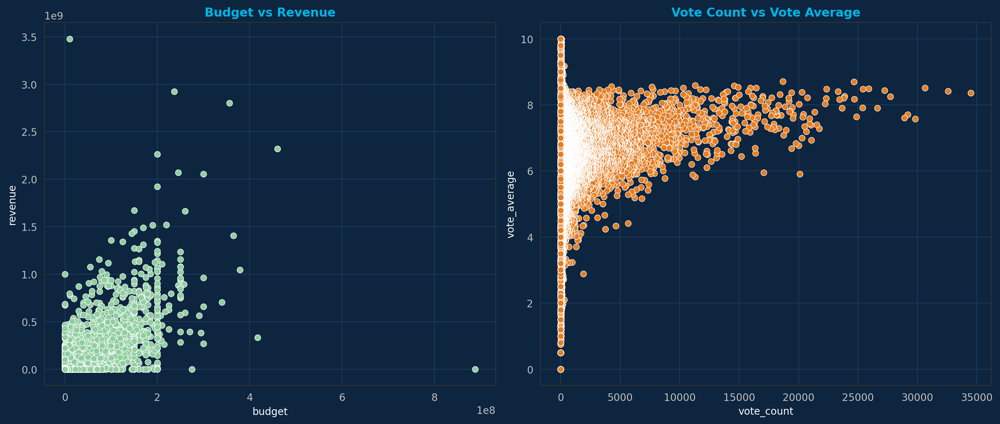

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

sns.scatterplot(x='budget', y='revenue', data=movies, ax=axes[0], color=TMDB_TERTIARY)
axes[0].set_title('Budget vs Revenue')

sns.scatterplot(x='vote_count', y='vote_average', data=movies, ax=axes[1], color=ACCENT_ORANGE)
axes[1].set_title('Vote Count vs Vote Average')

plt.tight_layout()
plt.show()

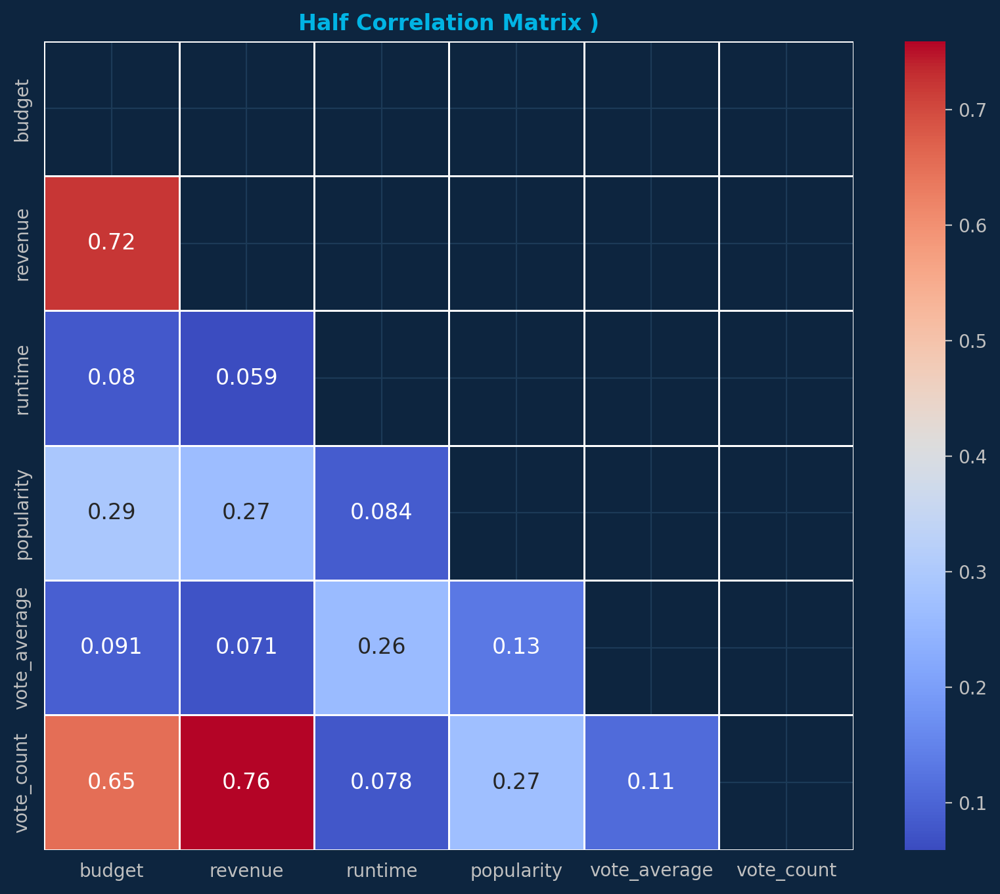

In [ ]:
# Compute correlation matrix
corr = movies[['budget','revenue','runtime','popularity','vote_average','vote_count']].corr()

# Create a mask for the upper triangle (so only lower triangle is shown)
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10,8))
sns.heatmap(
    corr, mask=mask, annot=True, cmap='coolwarm',
    square=True, linewidths=0.5,annot_kws={"size":12}
)

plt.title('Half Correlation Matrix )')
plt.show()


## Popularity & Ratings Analysis


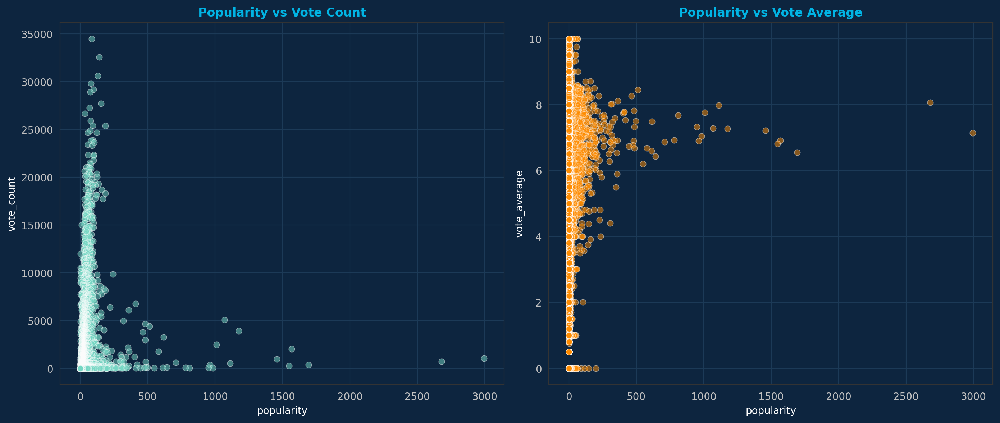

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

sns.scatterplot(x='popularity', y='vote_count', data=movies,
                ax=axes[0], color="#76D7C4", alpha=0.5)
axes[0].set_title('Popularity vs Vote Count')

sns.scatterplot(x='popularity', y='vote_average', data=movies,
                ax=axes[1], color="#FF8C00", alpha=0.5)
axes[1].set_title('Popularity vs Vote Average')

plt.tight_layout()
plt.show()

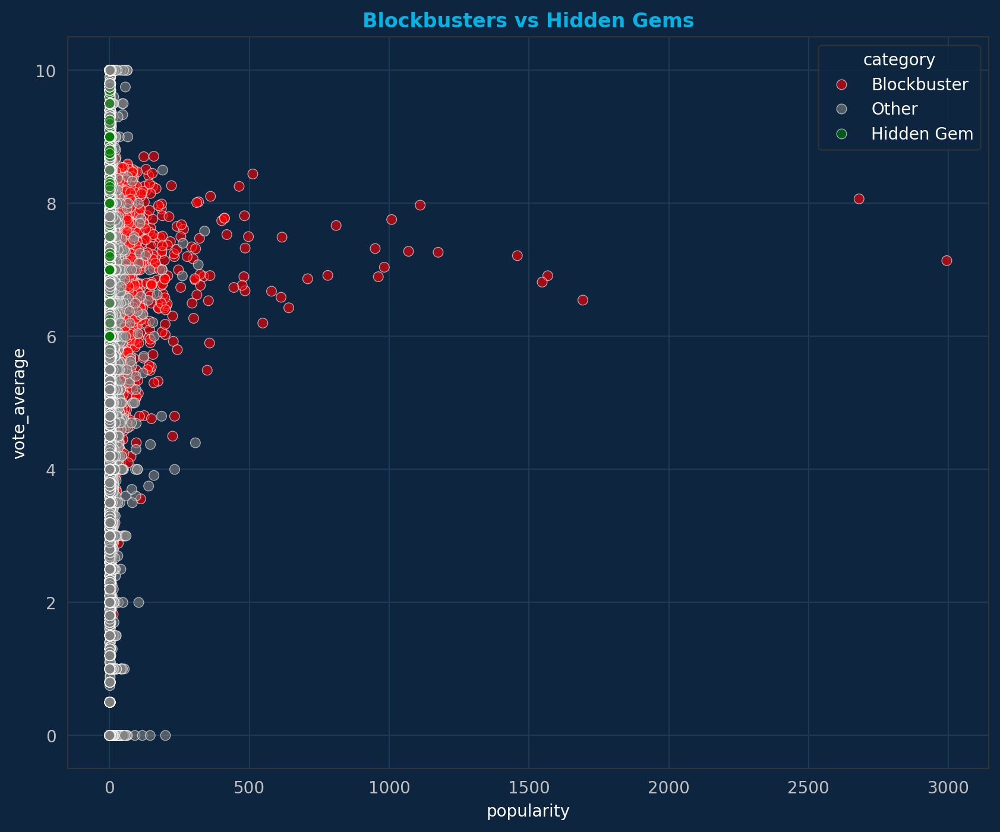

In [ ]:
pop_thresh = movies['popularity'].quantile(0.90)
vote_count_thresh = movies['vote_count'].quantile(0.90)
vote_avg_thresh = movies['vote_average'].quantile(0.75)

movies['category'] = 'Other'
movies.loc[(movies['popularity'] >= pop_thresh) &
           (movies['vote_count'] >= vote_count_thresh), 'category'] = 'Blockbuster'
movies.loc[(movies['popularity'] <= movies['popularity'].quantile(0.25)) &
           (movies['vote_average'] >= vote_avg_thresh), 'category'] = 'Hidden Gem'

plt.figure(figsize=(10,8))
sns.scatterplot(x='popularity', y='vote_average', data=movies,
                hue='category',
                palette={'Blockbuster':'red','Hidden Gem':'green','Other':'gray'},
                alpha=0.6)
plt.title('Blockbusters vs Hidden Gems')
plt.show()

/tmp/ipykernel_1624/3414053297.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='release_year', y='popularity', data=movies,
/tmp/ipykernel_1624/3414053297.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='release_quarter', y='vote_average', data=movies,


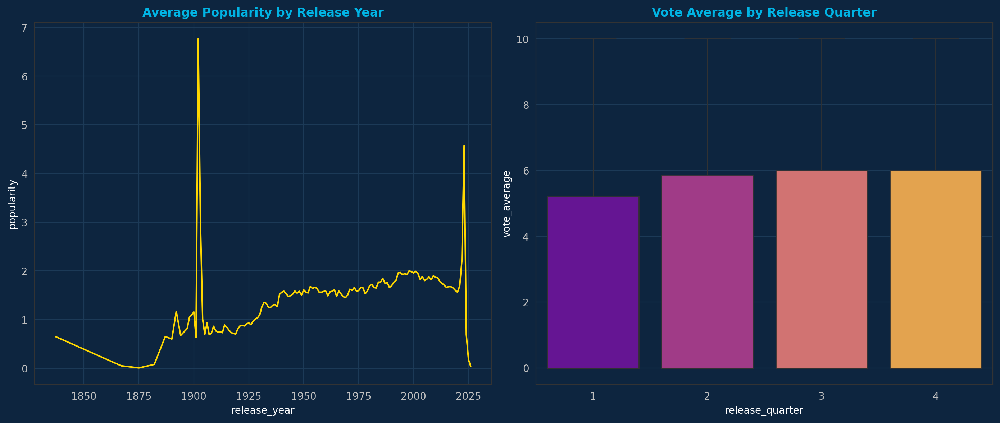

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

sns.lineplot(x='release_year', y='popularity', data=movies,
             estimator='mean', ci=None, color="#FFD700", ax=axes[0])
axes[0].set_title('Average Popularity by Release Year')

sns.boxplot(x='release_quarter', y='vote_average', data=movies,
            palette='plasma', ax=axes[1])
axes[1].set_title('Vote Average by Release Quarter')

plt.tight_layout()
plt.show()

In [ ]:
movies[['genres','genre_count']]

,genres,genre_count
0,"Action, Science Fiction, Adventure",3
1,"Adventure, Drama, Science Fiction",3
2,"Drama, Action, Crime, Thriller",4
3,"Action, Adventure, Fantasy, Science Fiction",4
4,"Science Fiction, Action, Adventure",3
...,...,...
578960,Music,1
578961,Horror,1
578962,"Documentary, TV Movie",2
578963,Drama,1


## Genre Analysis

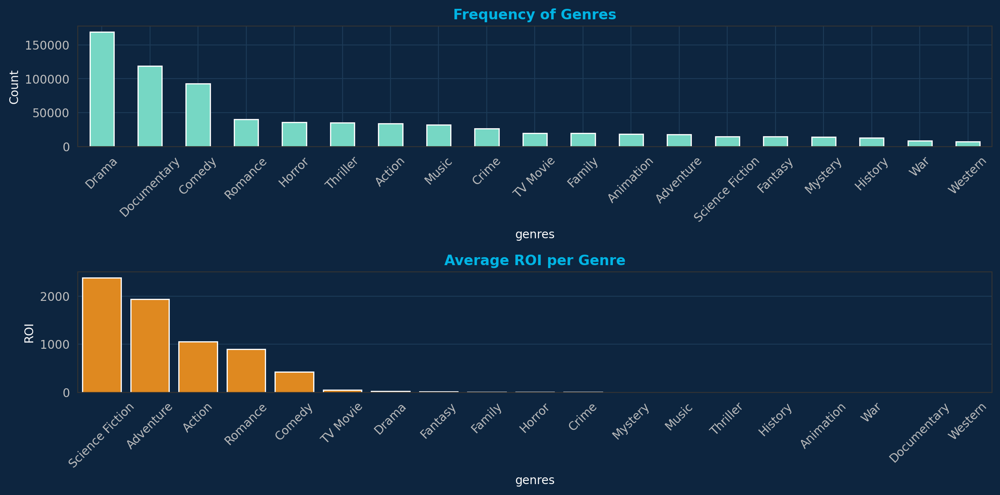

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(12,6))

# Frequency of genres
genres_copy = movies[['genres']].copy()
all_genres = genres_copy['genres'].dropna().str.split(',')
all_genres = all_genres.explode().str.strip()

all_genres.value_counts().plot(kind='bar', color="#76D7C4", ax=axes[0])
axes[0].set_title('Frequency of Genres')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Average ROI per Genre
genre_stats = movies.copy()
genre_stats['genres'] = genre_stats['genres'].str.split(',')
genre_stats = genre_stats.explode('genres')
genre_stats['genres'] = genre_stats['genres'].str.strip()

agg_stats = genre_stats.groupby('genres')[['ROI','revenue','vote_average']].mean().sort_values('ROI', ascending=False)

sns.barplot(x=agg_stats.index, y=agg_stats['ROI'], color="#FF8C00", ax=axes[1])
axes[1].set_title('Average ROI per Genre')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

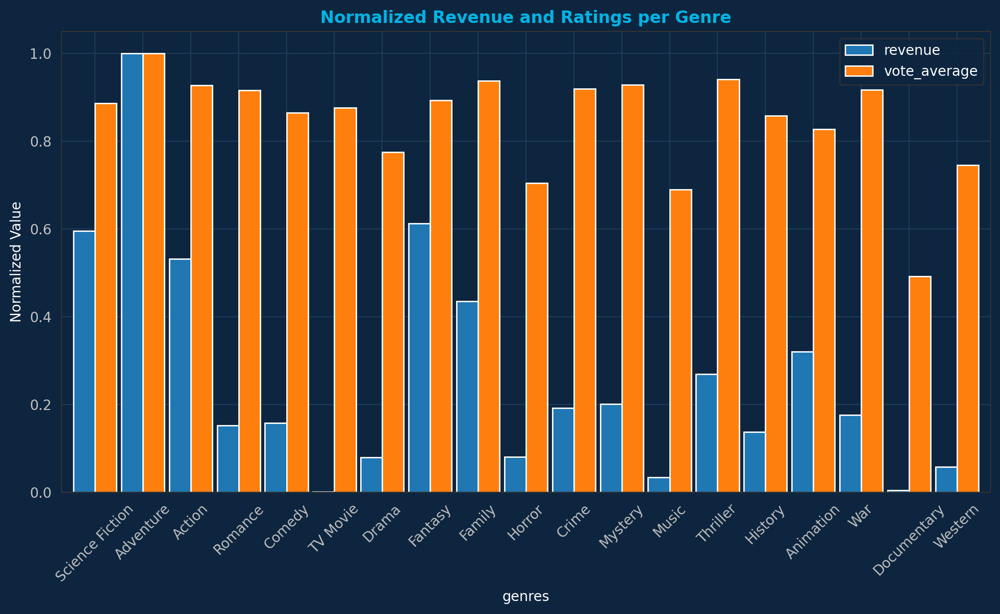

In [ ]:
norm_stats = agg_stats.copy()
norm_stats['revenue'] = norm_stats['revenue'] / norm_stats['revenue'].max()
norm_stats['vote_average'] = norm_stats['vote_average'] / norm_stats['vote_average'].max()

norm_stats[['revenue','vote_average']].plot(kind='bar', figsize=(12,6), width=0.9)
plt.title('Normalized Revenue and Ratings per Genre')
plt.ylabel('Normalized Value')
plt.xticks(rotation=45)
plt.show()


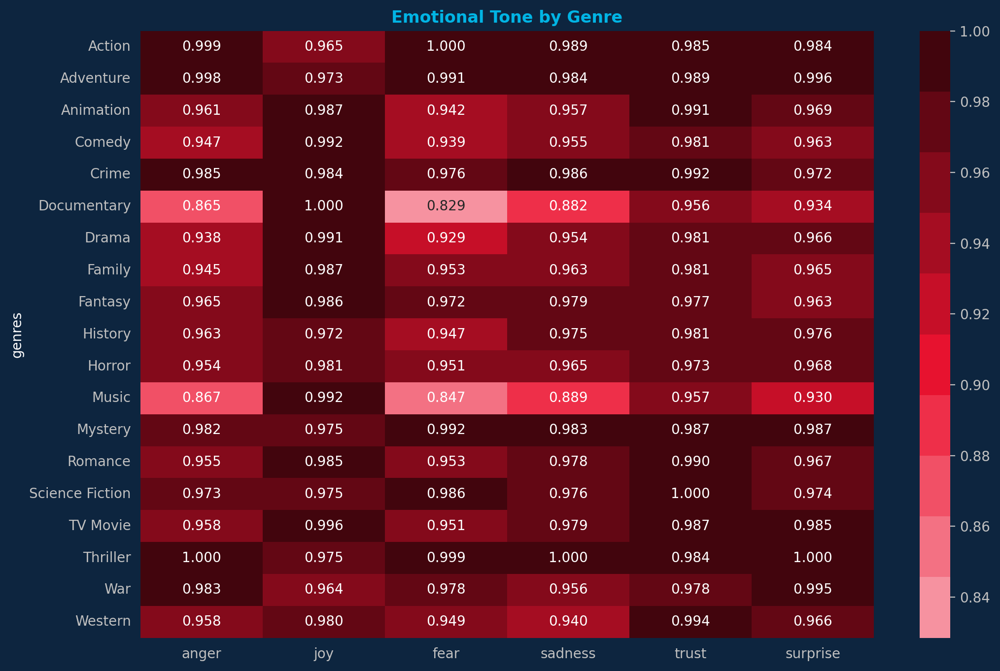

In [ ]:
from matplotlib.colors import ListedColormap

# Custom red palette from your provided hex codes
red_palette = [
    "#f692a0", "#f37183", "#f15066", "#ee2f49", "#e7122f",
    "#c60f28", "#a50d22", "#840a1b", "#630714", "#42050d"]

# Build a colormap
cmap_red = ListedColormap(red_palette)

# Emotional tone by genre
emo_cols = ['anger','joy','fear','sadness','trust','surprise']
emo_stats = genre_stats.groupby('genres')[emo_cols].mean()
emo_norm = emo_stats.div(emo_stats.max())

plt.figure(figsize=(12,8))
sns.heatmap(emo_norm, cmap=cmap_red, annot=True, fmt=".3f")
plt.title('Emotional Tone by Genre')
plt.show()


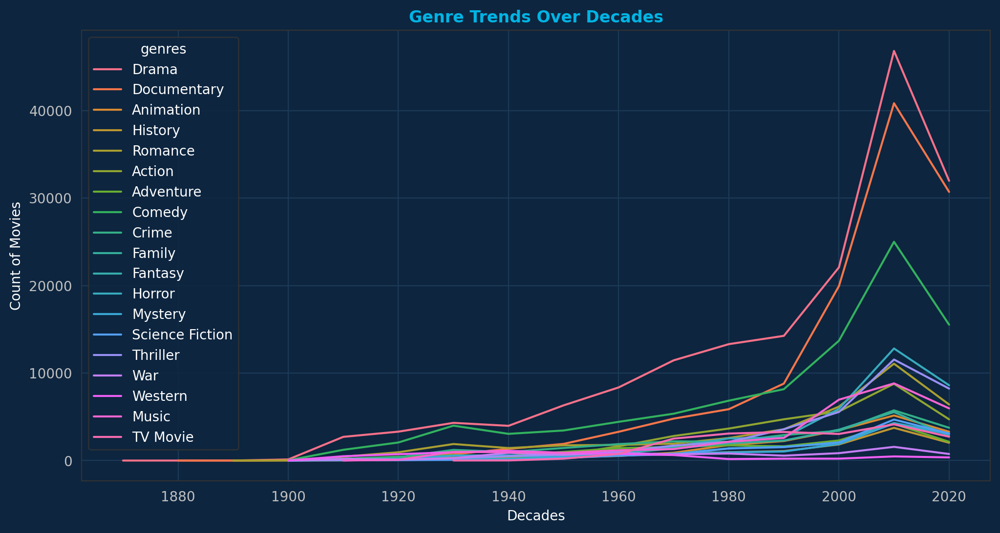

In [ ]:
genre_stats['release_decade'] = (genre_stats['release_year']//10)*10
genre_decade = genre_stats.groupby(['release_decade','genres']).size().reset_index(name='count')

plt.figure(figsize=(12,6))
sns.lineplot(data=genre_decade,x='release_decade', y='count', hue='genres')
plt.title('Genre Trends Over Decades')
plt.xlabel('Decades')
plt.ylabel('Count of Movies')
plt.show()

## Directors & Actors Analysis

### Directors Analysis

/tmp/ipykernel_1624/2371639683.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(top_roi_directors.index, rotation=45, ha="right")
/tmp/ipykernel_1624/2371639683.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(top_revenue_directors.index, rotation=45, ha="right")


[Text(0, 0, 'James Cameron'),
 Text(1, 0, 'Joe Russo'),
 Text(2, 0, 'J.J. Abrams'),
 Text(3, 0, 'Jon Watts'),
 Text(4, 0, 'Colin Trevorrow'),
 Text(5, 0, 'Jon Favreau'),
 Text(6, 0, 'Joss Whedon'),
 Text(7, 0, 'James Wan'),
 Text(8, 0, 'Joseph Kosinski'),
 Text(9, 0, 'Jennifer Lee')]

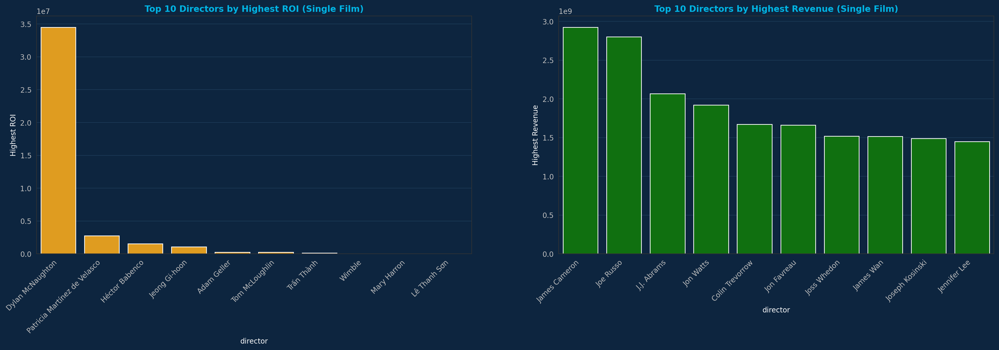

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top 10 directors by highest ROI in any film
top_roi_directors = (
    movies.groupby('director')['ROI']
    .max()
    .sort_values(ascending=False)
    .head(10)
)

# Top 10 directors by highest revenue in any film
top_revenue_directors = (
    movies.groupby('director')['revenue']
    .max()
    .sort_values(ascending=False)
    .head(10)
)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(24,6))

# ROI plot
sns.barplot(x=top_roi_directors.index, y=top_roi_directors.values,
            color="orange", ax=axes[0])
axes[0].set_title("Top 10 Directors by Highest ROI (Single Film)")
axes[0].set_ylabel("Highest ROI")
axes[0].set_xticklabels(top_roi_directors.index, rotation=45, ha="right")

# Revenue plot
sns.barplot(x=top_revenue_directors.index, y=top_revenue_directors.values,
            color="green", ax=axes[1])
axes[1].set_title("Top 10 Directors by Highest Revenue (Single Film)")
axes[1].set_ylabel("Highest Revenue")
axes[1].set_xticklabels(top_revenue_directors.index, rotation=45, ha="right")


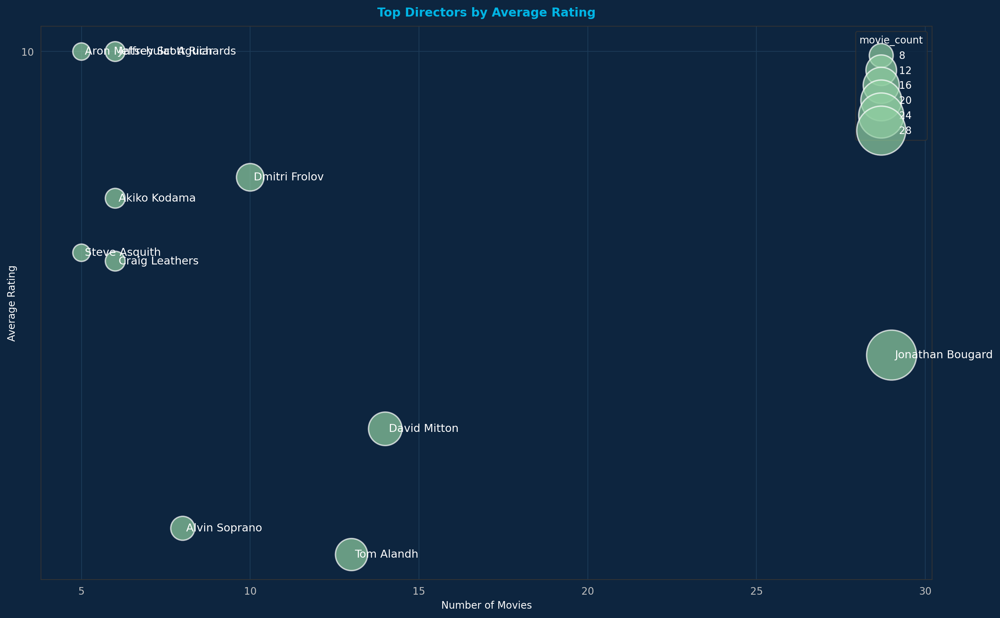

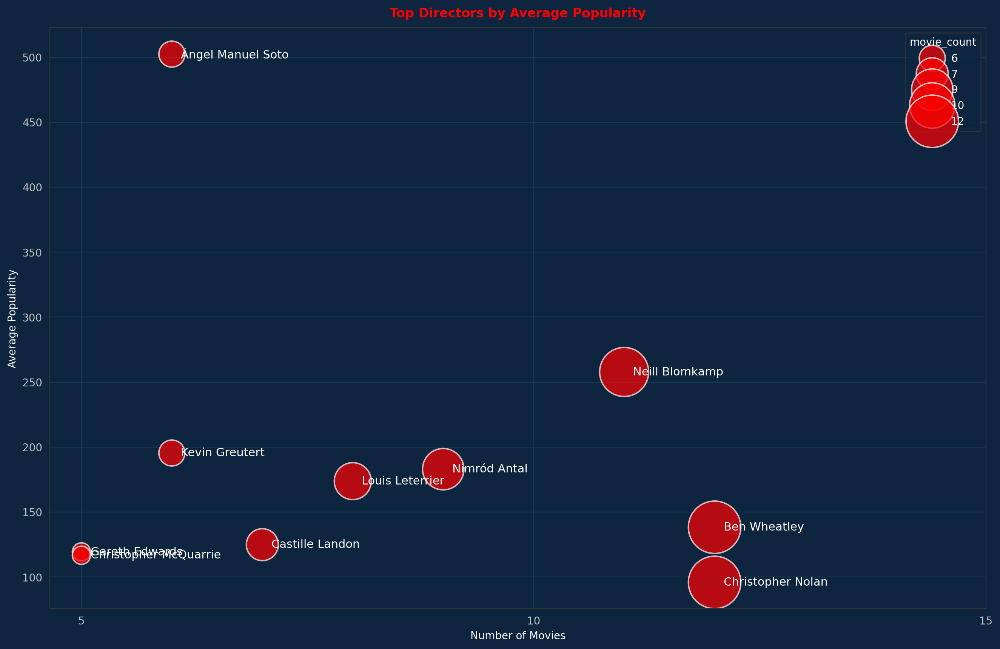

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

# Explode directors (if multiple per film, adjust accordingly)
director_stats = movies.copy()

# Filter only films with rating > 8
high_rating = director_stats[director_stats['vote_average'] > 8]

# Aggregate: average rating and total movies per director
top_directors_rating = (
    high_rating.groupby('director')
    .agg(
        avg_rating=('vote_average', 'mean'),
        movie_count=('id', 'count')   # replace with your unique ID column
    )
    .query('movie_count >= 5')              # directors with >=5 movies
    .sort_values(by='avg_rating', ascending=False)
    .head(10)
)

# Bubble Chart
fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(1, 1)
ax = fig.add_subplot(gs[0])

sns.scatterplot(
    data=top_directors_rating,
    x="movie_count",
    y="avg_rating",
    size="movie_count",
    sizes=(300, 2500),
    color=TMDB_TERTIARY,
    alpha=0.7,
    ax=ax
)

ax.set_title("Top Directors by Average Rating", pad=10)
ax.set_xlabel("Number of Movies")
ax.set_ylabel("Average Rating")

# X-axis ticks: 5, 10, 15, ...
max_movies = top_directors_rating["movie_count"].max()
ax.set_xticks(range(5, max_movies + 5, 5))

# Y-axis ticks: rounded rating values
ax.set_yticks(sorted(top_directors_rating["avg_rating"].round().unique()))

# Add director names beside each bubble
for director, row in top_directors_rating.iterrows():
    ax.text(
        row["movie_count"] + 0.1,      # shift right
        row["avg_rating"],             # same y
        director,                      # director name
        color="white",
        fontsize=11,
        va="center"
    )
plt.show()




# Aggregate: average popularity and total movies per director
top_directors_popularity = (
    director_stats.groupby('director')
    .agg(
        avg_popularity=('popularity', 'mean'),
        movie_count=('id', 'count')   # replace 'id' with your unique movie ID column
    )
    .query('movie_count >= 5')              # directors with >=5 movies
    .sort_values(by='avg_popularity', ascending=False)
    .head(10)
)

# Bubble Chart for Popularity
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111)

sns.scatterplot(
    data=top_directors_popularity,
    x="movie_count",
    y="avg_popularity",
    size="movie_count",
    sizes=(300, 2500),
    color="red",
    alpha=0.7,
    ax=ax
)

ax.set_title("Top Directors by Average Popularity", pad=10, color='red')
ax.set_xlabel("Number of Movies")
ax.set_ylabel("Average Popularity")

# X-axis ticks: 5, 10, 15, ...
max_movies = top_directors_popularity["movie_count"].max()
ax.set_xticks(range(5, max_movies + 5, 5))

# Y-axis ticks: let Matplotlib auto-scale (no manual override)

# Add director names beside each bubble
for director, row in top_directors_popularity.iterrows():
    ax.text(
        row["movie_count"] + 0.1,      # shift right
        row["avg_popularity"],         # same y
        director,                      # director name
        color="white",
        fontsize=11,
        va="center"
    )

plt.show()


### Actors Analysis

/tmp/ipykernel_47096/1235897882.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(top_ROI_actors.index, rotation=45, ha="right")
/tmp/ipykernel_47096/1235897882.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(top_revenue_actors.index, rotation=45, ha="right")


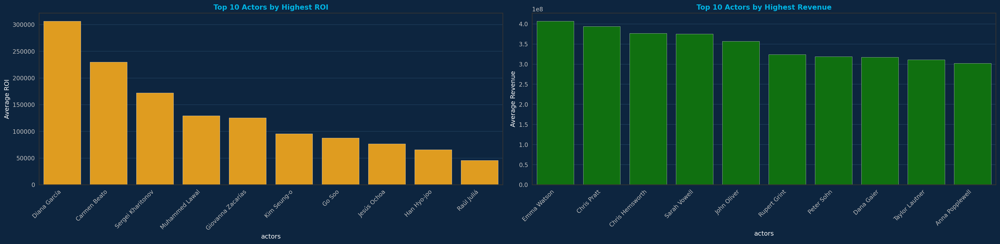

In [ ]:
actor_stats = (
    movies.assign(actors=movies['actors'].str.split(','))
    .explode('actors')
)
actor_stats['actors'] = actor_stats['actors'].str.strip()

actor_summary = (
    actor_stats.groupby('actors')[['ROI','revenue','vote_average']]
    .mean()
    .join(actor_stats['actors'].value_counts().rename('movie_count'))
)

top_ROI_actors = (actor_summary.query("movie_count >= 5")
    .sort_values('ROI', ascending=False)
    .head(10))  # limit to top 10

top_revenue_actors = (actor_summary.query("movie_count >= 5")
    .sort_values('revenue', ascending=False)
    .head(10))

fig, axes = plt.subplots(1, 2, figsize=(24,6))

# ROI plot
sns.barplot(x=top_ROI_actors.index, y=top_ROI_actors['ROI'],
            color="orange", ax=axes[0])
axes[0].set_title("Top 10 Actors by Highest ROI")
axes[0].set_ylabel("Average ROI")
axes[0].set_xticklabels(top_ROI_actors.index, rotation=45, ha="right")

# Revenue plot
sns.barplot(x=top_revenue_actors.index, y=top_revenue_actors['revenue'],
            color="green", ax=axes[1])
axes[1].set_title("Top 10 Actors by Highest Revenue")
axes[1].set_ylabel("Average Revenue")
axes[1].set_xticklabels(top_revenue_actors.index, rotation=45, ha="right")

plt.tight_layout()
plt.show()


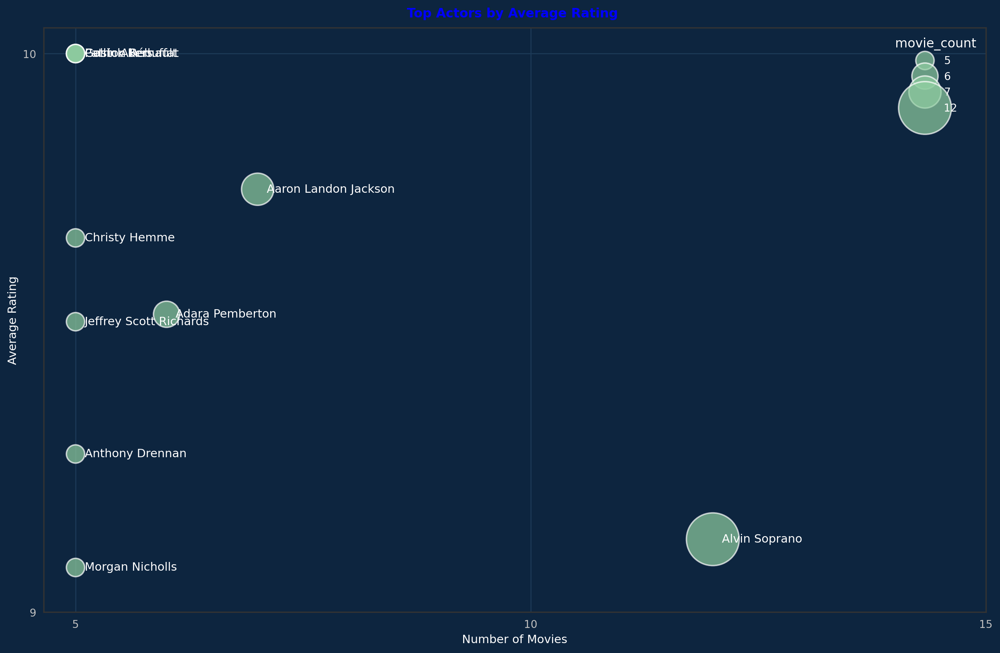

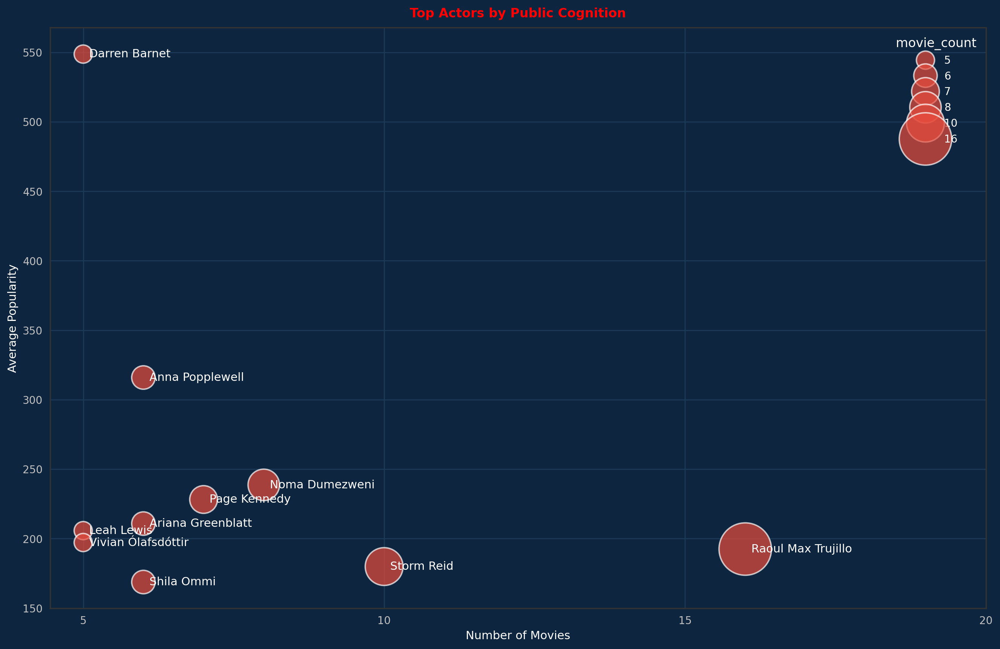

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

# --- Explode actors (split multiple names per film) ---
actor_stats = (
    movies.assign(actors=movies['actors'].str.split(','))
    .explode('actors')
)
actor_stats['actors'] = actor_stats['actors'].str.strip()

# --- Aggregate: average rating and total movies per actor ---
top_actors_rating = (
    actor_stats.groupby('actors')
    .agg(
        avg_rating=('vote_average', 'mean'),
        movie_count=('id', 'count')   # replace with your unique ID column
    )
    .query('movie_count >= 5')              # actors with >=5 movies
    .sort_values(by='avg_rating', ascending=False)
    .head(10)
)

# --- Bubble Chart for Average Rating (Academic) ---
fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(1, 1)
ax = fig.add_subplot(gs[0])

sns.scatterplot(
    data=top_actors_rating,
    x="movie_count",
    y="avg_rating",
    size="movie_count",
    sizes=(300, 2500),
    color=TMDB_TERTIARY,
    alpha=0.7,
    ax=ax
)

ax.set_title("Top Actors by Average Rating ", pad=10, color='blue')
ax.set_xlabel("Number of Movies")
ax.set_ylabel("Average Rating")

# X-axis ticks: 5, 10, 15, ...
max_movies = top_actors_rating["movie_count"].max()
ax.set_xticks(range(5, max_movies + 5, 5))

# Y-axis ticks: rounded rating values
ax.set_yticks(sorted(top_actors_rating["avg_rating"].round().unique()))

# Add actor names beside each bubble
for actor, row in top_actors_rating.iterrows():
    ax.text(
        row["movie_count"] + 0.1,
        row["avg_rating"],
        actor,
        color="white",
        fontsize=11,
        va="center"
    )

plt.show()


# --- Aggregate: average popularity and total movies per actor ---
top_actors_popularity = (
    actor_stats.groupby('actors')
    .agg(
        avg_popularity=('popularity', 'mean'),
        movie_count=('id', 'count')   # replace with your unique movie ID column
    )
    .query('movie_count >= 5')              # actors with >=5 movies
    .sort_values(by='avg_popularity', ascending=False)
    .head(10)
)

# --- Bubble Chart for Average Popularity (Blockbusters) ---
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111)

sns.scatterplot(
    data=top_actors_popularity,
    x="movie_count",
    y="avg_popularity",
    size="movie_count",
    sizes=(300, 2500),
    color= ACCENT_RED,
    alpha=0.7,
    ax=ax
)

ax.set_title("Top Actors by Public Cognition", pad=10, color='red')
ax.set_xlabel("Number of Movies")
ax.set_ylabel("Average Popularity")

# X-axis ticks: 5, 10, 15, ...
max_movies = top_actors_popularity["movie_count"].max()
ax.set_xticks(range(5, max_movies + 5, 5))

# Y-axis ticks: let Matplotlib auto-scale (no manual override)

# Add actor names beside each bubble
for actor, row in top_actors_popularity.iterrows():
    ax.text(
        row["movie_count"] + 0.1,
        row["avg_popularity"],
        actor,
        color="white",
        fontsize=11,
        va="center"
    )

plt.show()


### Hit-makers Contribution

/tmp/ipykernel_30991/58204542.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pairs_rating, x="vote_average", y="pair", palette=colors_rating)


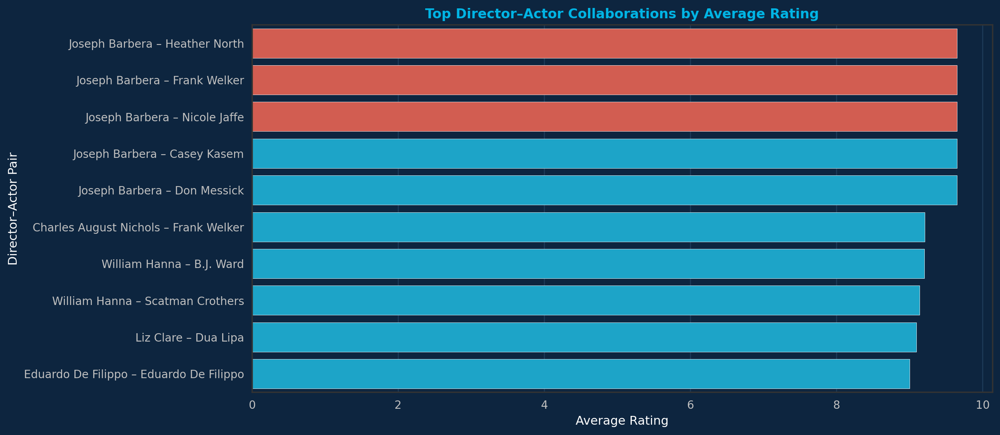

/tmp/ipykernel_30991/58204542.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pairs_popularity, x="popularity", y="pair", palette=colors_pop)


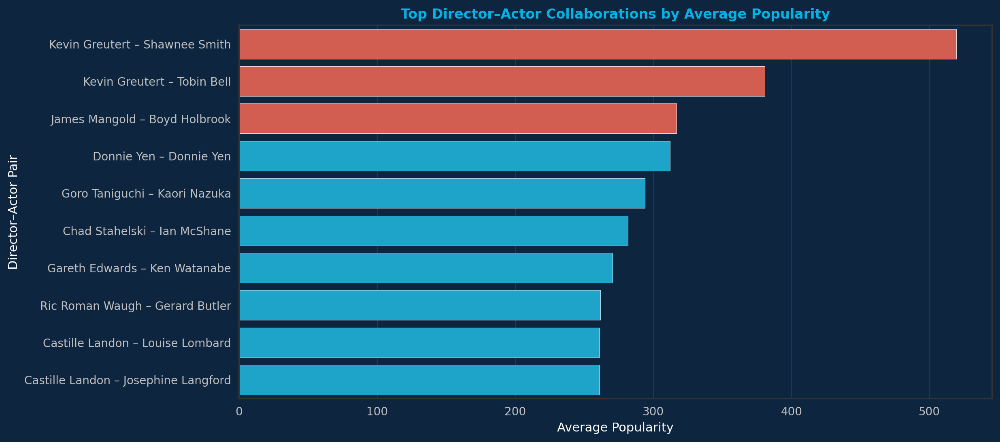

/tmp/ipykernel_30991/58204542.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pairs_roi, x="ROI", y="pair", palette=colors_roi)


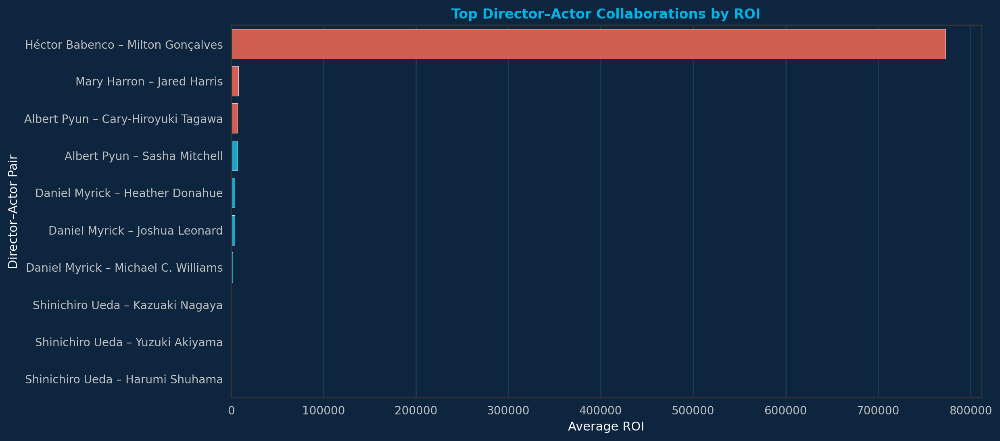

/tmp/ipykernel_30991/58204542.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pairs_revenue, x="revenue", y="pair", palette=colors_rev)


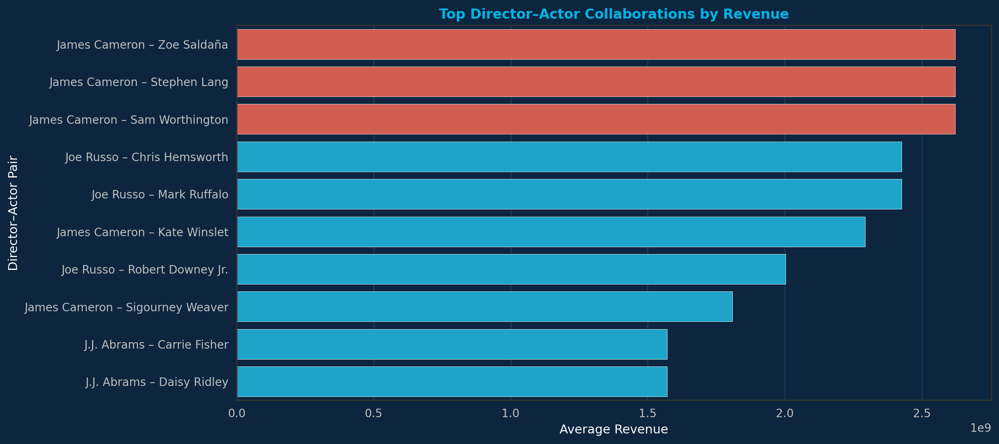

In [20]:
collab = movies.assign(actors=movies['actors'].str.split(',')).explode('actors')
collab['actors'] = collab['actors'].str.strip()
collab = collab.groupby(['director','actors']).filter(lambda g: len(g) > 1)
collab = collab[collab['vote_count'] >= 50]

# --- Helper to assign colors ---
def make_colors(df, highlight_color=ACCENT_RED, base_color=TMDB_SECONDARY, top_n=3):
    return [highlight_color if i < top_n else base_color for i in range(len(df))]

# --- Highest Rating collaborations ---
pairs_rating = (
    collab.groupby(['director','actors'])['vote_average']
    .mean()
    .reset_index()
    .sort_values('vote_average', ascending=False)
    .head(10)
)
pairs_rating["pair"] = pairs_rating["director"] + " – " + pairs_rating["actors"]

plt.figure(figsize=(12,6))
colors_rating = make_colors(pairs_rating)
sns.barplot(data=pairs_rating, x="vote_average", y="pair", palette=colors_rating)
plt.title("Top Director–Actor Collaborations by Average Rating")
plt.xlabel("Average Rating")
plt.ylabel("Director–Actor Pair")
plt.show()

# --- Highest Popularity collaborations ---
pairs_popularity = (
    collab.groupby(['director','actors'])['popularity']
    .mean()
    .reset_index()
    .sort_values('popularity', ascending=False)
    .head(10)
)
pairs_popularity["pair"] = pairs_popularity["director"] + " – " + pairs_popularity["actors"]

plt.figure(figsize=(12,6))
colors_pop = make_colors(pairs_popularity)
sns.barplot(data=pairs_popularity, x="popularity", y="pair", palette=colors_pop)
plt.title("Top Director–Actor Collaborations by Average Popularity")
plt.xlabel("Average Popularity")
plt.ylabel("Director–Actor Pair")
plt.show()

# --- Highest ROI collaborations ---
pairs_roi = (
    collab.groupby(['director','actors'])['ROI']
    .mean()
    .reset_index()
    .sort_values('ROI', ascending=False)
    .head(10)
)
pairs_roi["pair"] = pairs_roi["director"] + " – " + pairs_roi["actors"]

plt.figure(figsize=(12,6))
colors_roi = make_colors(pairs_roi)
sns.barplot(data=pairs_roi, x="ROI", y="pair", palette=colors_roi)
plt.title("Top Director–Actor Collaborations by ROI")
plt.xlabel("Average ROI")
plt.ylabel("Director–Actor Pair")
plt.show()

# --- Highest Revenue collaborations ---
pairs_revenue = (
    collab.groupby(['director','actors'])['revenue']
    .mean()
    .reset_index()
    .sort_values('revenue', ascending=False)
    .head(10)
)
pairs_revenue["pair"] = pairs_revenue["director"] + " – " + pairs_revenue["actors"]

plt.figure(figsize=(12,6))
colors_rev = make_colors(pairs_revenue)
sns.barplot(data=pairs_revenue, x="revenue", y="pair", palette=colors_rev)
plt.title("Top Director–Actor Collaborations by Revenue")
plt.xlabel("Average Revenue")
plt.ylabel("Director–Actor Pair")
plt.show()


## Temporal Analysis

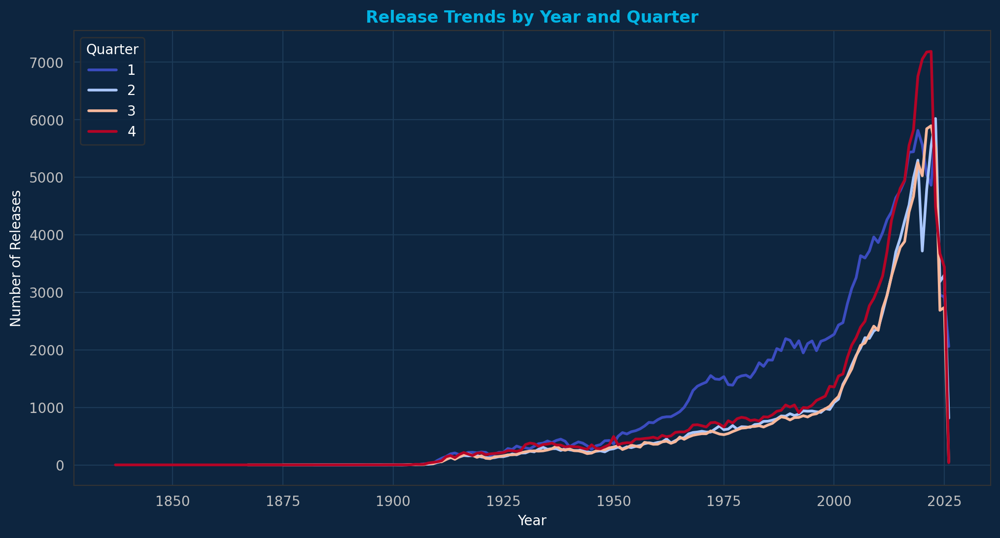

In [ ]:
release_trends = (
    movies.groupby(['release_year','release_quarter'])
    .size()
    .reset_index(name='count')
)

plt.figure(figsize=(12,6))

# Line chart with different colors for each quarter, no markers
sns.lineplot(
    data=release_trends,
    x="release_year",
    y="count",
    hue="release_quarter",   # separate line per quarter,
    palette="coolwarm",
    linewidth=2              # thicker lines for clarity
)

plt.title("Release Trends by Year and Quarter")
plt.xlabel("Year")
plt.ylabel("Number of Releases")
plt.legend(title="Quarter")
plt.show()


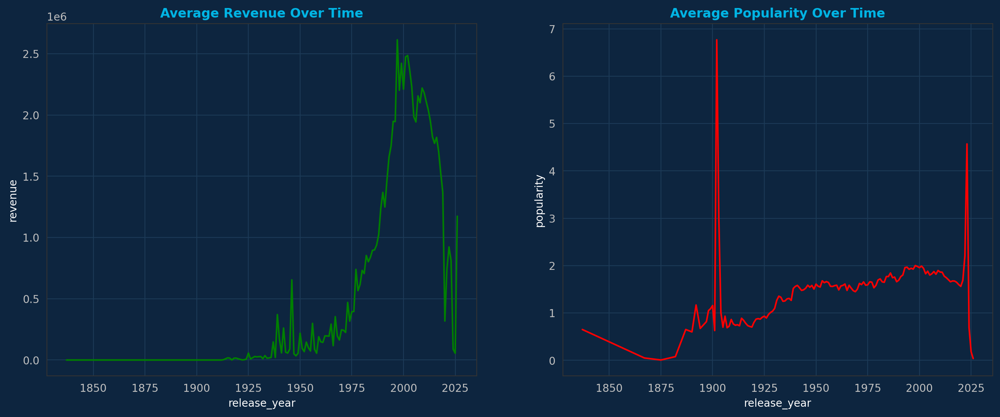

In [ ]:
trends = movies.groupby('release_year')[['revenue','popularity']].mean().reset_index()

fig, ax = plt.subplots(1,2, figsize=(16,6))

sns.lineplot(data=trends, x="release_year", y="revenue", ax=ax[0], color="green")
ax[0].set_title("Average Revenue Over Time")

sns.lineplot(data=trends, x="release_year", y="popularity", ax=ax[1], color="red")
ax[1].set_title("Average Popularity Over Time")

plt.show()


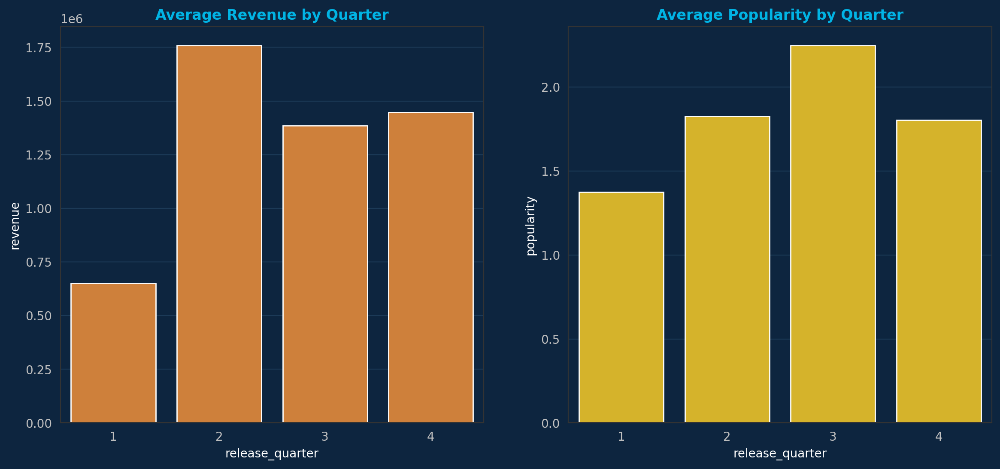

In [ ]:
seasonal = movies.groupby('release_quarter')[['revenue','popularity']].mean().reset_index()

fig, ax = plt.subplots(1,2, figsize=(14,6))
sns.barplot(data=seasonal, x="release_quarter", y="revenue", ax=ax[0], color=ACCENT_ORANGE)
ax[0].set_title("Average Revenue by Quarter")

sns.barplot(data=seasonal, x="release_quarter", y="popularity", ax=ax[1], color=ACCENT_YELLOW)
ax[1].set_title("Average Popularity by Quarter")

plt.show()


/tmp/ipykernel_1624/3065413196.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nlargest(3, 'count'))


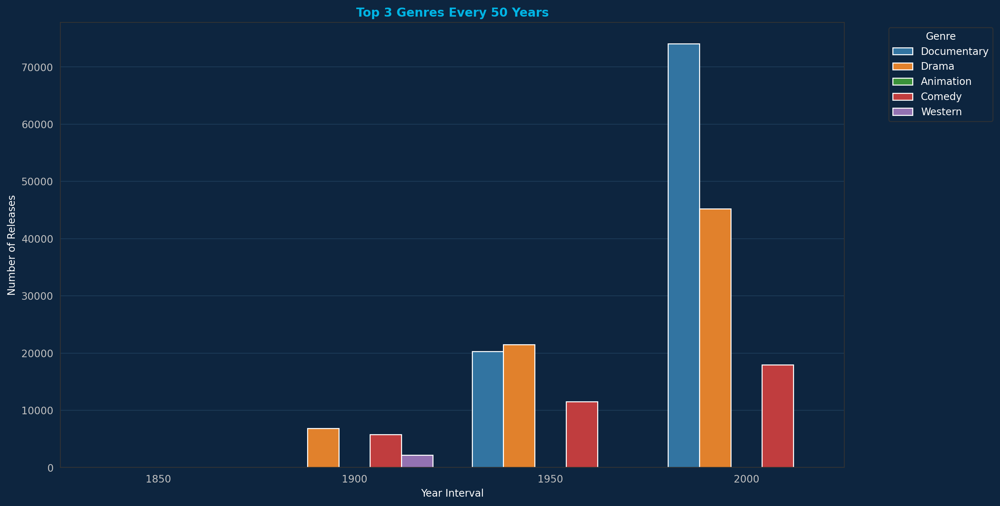

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Prepare genre stats ---
genre_stats = (
    movies.assign(genres=movies['genres'].str.split(';'))
    .explode('genres')
)
genre_stats['genres'] = genre_stats['genres'].str.strip()

# --- Bin years into 50-year intervals ---
genre_stats['year_bin'] = (genre_stats['release_year'] // 50) * 50

# --- Count releases per genre per bin ---
genre_trends = (
    genre_stats.groupby(['year_bin','genres'])
    .size()
    .reset_index(name='count')
)

# --- Select top 3 genres per bin ---
top_genres_per_bin = (
    genre_trends.groupby('year_bin')
    .apply(lambda g: g.nlargest(3, 'count'))
    .reset_index(drop=True)
)

# --- Plot bar chart ---
plt.figure(figsize=(14,8))
sns.barplot(
    data=top_genres_per_bin,
    x="year_bin",
    y="count",
    hue="genres"
)

plt.title("Top 3 Genres Every 50 Years")
plt.xlabel("Year Interval")
plt.ylabel("Number of Releases")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


/tmp/ipykernel_1624/107278516.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nlargest(5, 'count'))


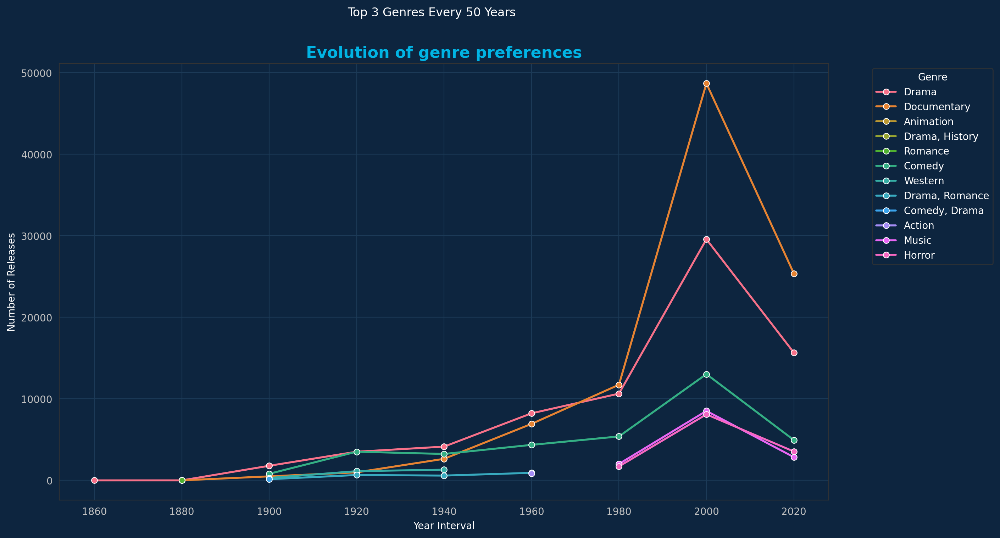

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Prepare genre stats ---
genre_stats = (
    movies.assign(genres=movies['genres'].str.split(';'))
    .explode('genres')
)
genre_stats['genres'] = genre_stats['genres'].str.strip()

# --- Bin years into 50-year intervals ---
genre_stats['year_bin'] = (genre_stats['release_year'] // 20) * 20

# --- Count releases per genre per bin ---
genre_trends = (
    genre_stats.groupby(['year_bin','genres'])
    .size()
    .reset_index(name='count')
)

# --- Select top 3 genres per bin ---
top_genres_per_bin = (
    genre_trends.groupby('year_bin')
    .apply(lambda g: g.nlargest(5, 'count'))
    .reset_index(drop=True)
)

# --- Plot line chart ---
plt.figure(figsize=(14,8))
sns.lineplot(
    data=top_genres_per_bin,
    x="year_bin",
    y="count",
    hue="genres",
    marker="o",        # optional: dots at each bin
    linewidth=2
)
plt.title("Evolution of genre preferences",fontsize=16)
plt.suptitle("Top 3 Genres Every 50 Years",fontsize=12)
plt.xlabel("Year Interval")
plt.ylabel("Number of Releases")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
movies.release_year.describe()

,release_year
count,578965.000000
mean,1999.427446
std,25.542422
min,1837.000000
25%,1987.000000
50%,2009.000000
75%,2018.000000
max,2026.000000


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


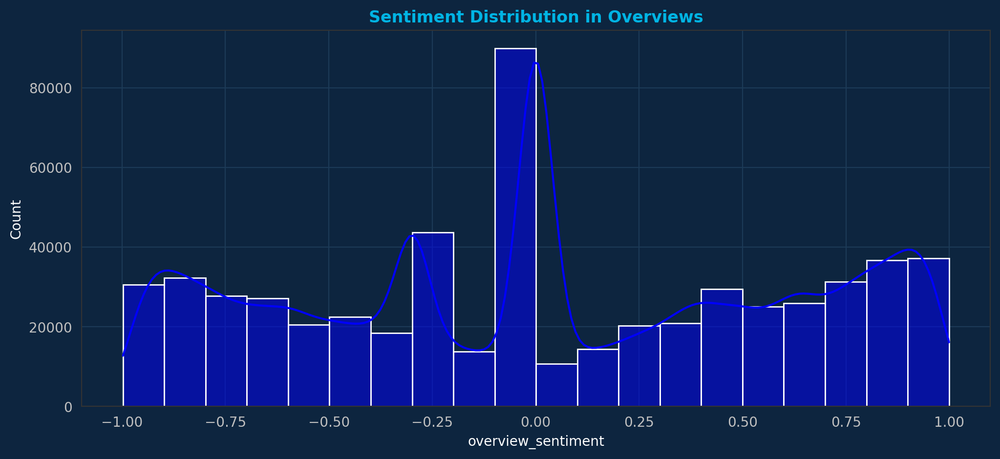

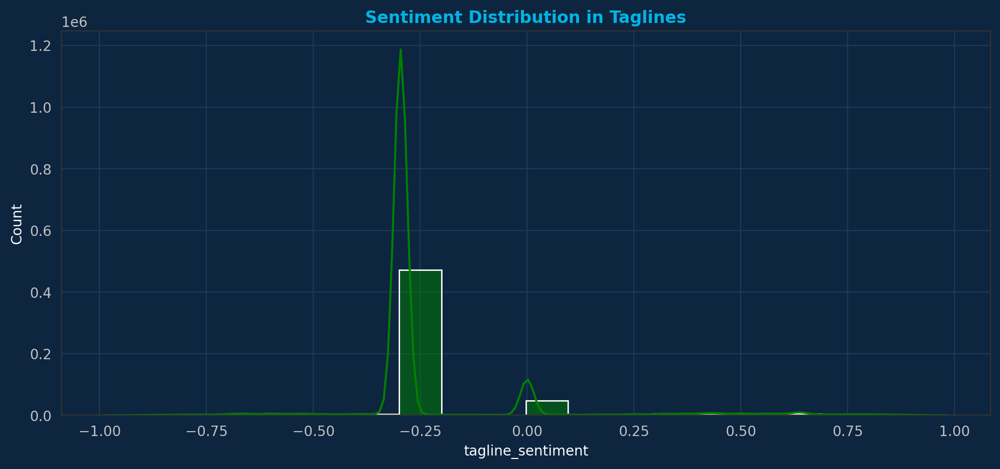

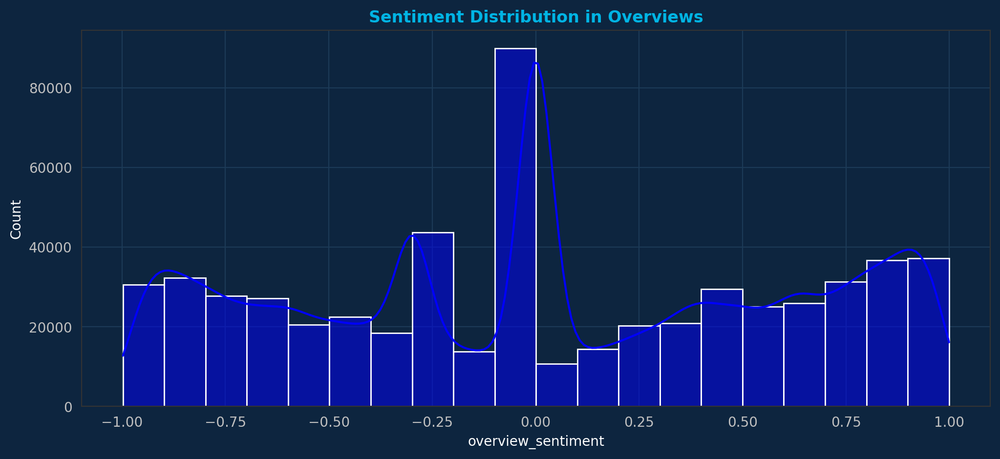

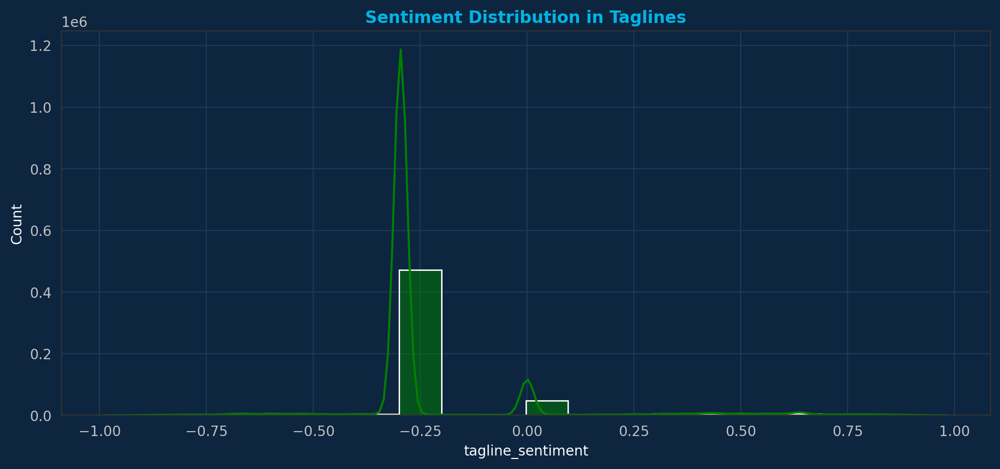

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')

sia = SentimentIntensityAnalyzer()
movies['overview_sentiment'] = movies['overview'].fillna('').apply(lambda x: sia.polarity_scores(str(x))['compound'])
movies['tagline_sentiment'] = movies['tagline'].fillna('').apply(lambda x: sia.polarity_scores(str(x))['compound'])

plt.figure(figsize=(12,5))
sns.histplot(movies['overview_sentiment'], bins=20, kde=True, color='blue')
plt.title("Sentiment Distribution in Overviews")
plt.show()

plt.figure(figsize=(12,5))
sns.histplot(movies['tagline_sentiment'], bins=20, kde=True, color='green')
plt.title("Sentiment Distribution in Taglines")
plt.show()

sia = SentimentIntensityAnalyzer()
movies['overview_sentiment'] = movies['overview'].fillna('').apply(lambda x: sia.polarity_scores(str(x))['compound'])
movies['tagline_sentiment'] = movies['tagline'].fillna('').apply(lambda x: sia.polarity_scores(str(x))['compound'])

plt.figure(figsize=(12,5))
sns.histplot(movies['overview_sentiment'], bins=20, kde=True, color='blue')
plt.title("Sentiment Distribution in Overviews")
plt.show()

plt.figure(figsize=(12,5))
sns.histplot(movies['tagline_sentiment'], bins=20, kde=True, color='green')
plt.title("Sentiment Distribution in Taglines")
plt.show()

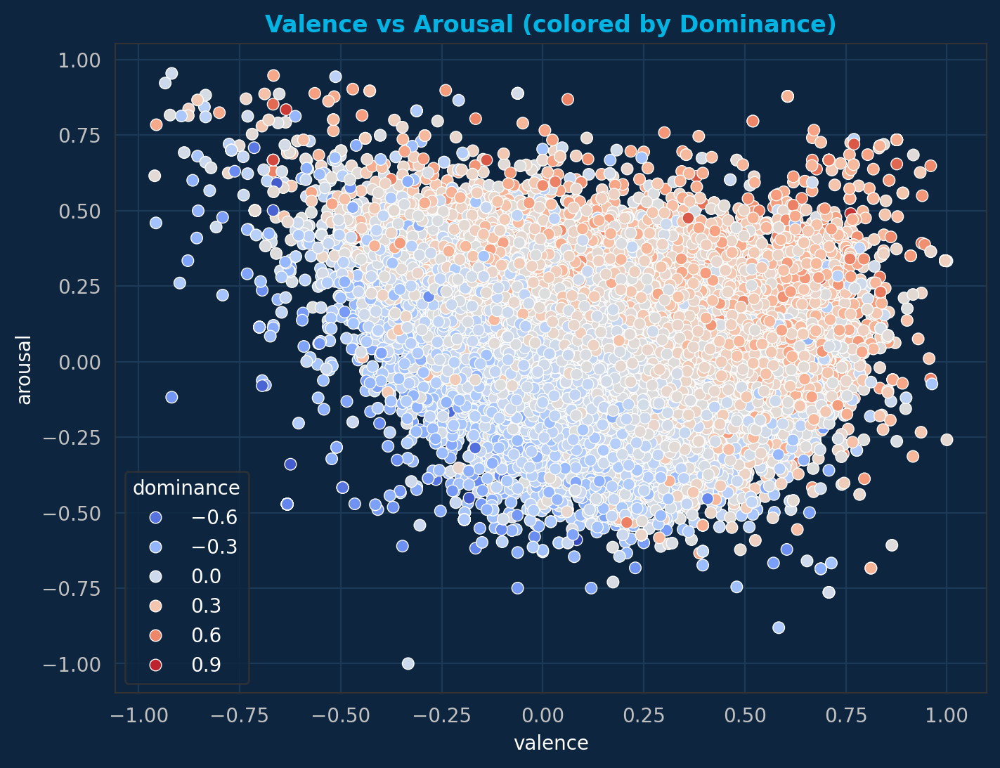

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=movies, x='valence', y='arousal', hue='dominance', palette='coolwarm')
plt.title("Valence vs Arousal (colored by Dominance)")
plt.show()

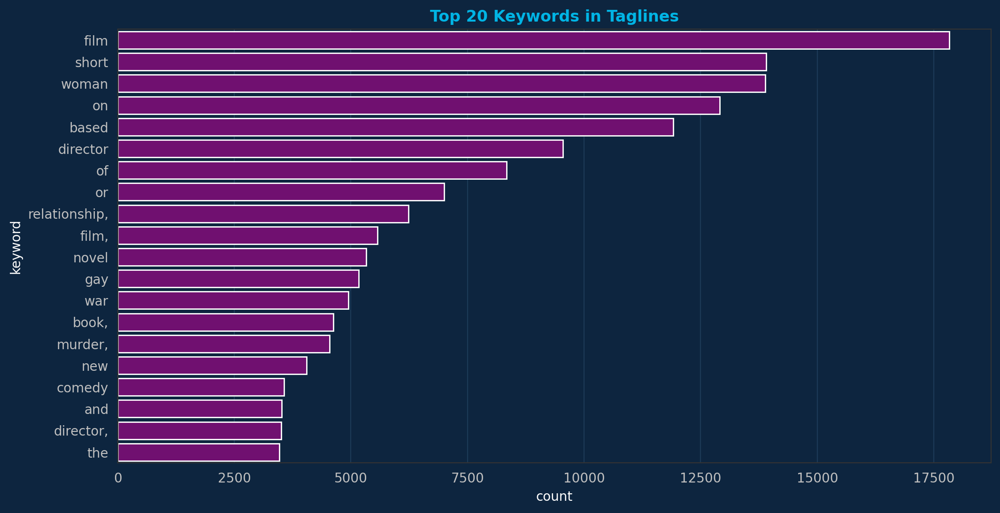

In [ ]:
from collections import Counter

all_keywords = " ".join(movies['keywords'].dropna())
freq = Counter(all_keywords.split())
top_keywords = pd.DataFrame(freq.most_common(20), columns=['keyword','count'])

plt.figure(figsize=(12,6))
sns.barplot(data=top_keywords, x='count', y='keyword', color='purple')
plt.title("Top 20 Keywords in Taglines")
plt.show()

/tmp/ipykernel_1624/877928020.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_rating = movies.groupby('sentiment_bin')['vote_average'].mean().reset_index()


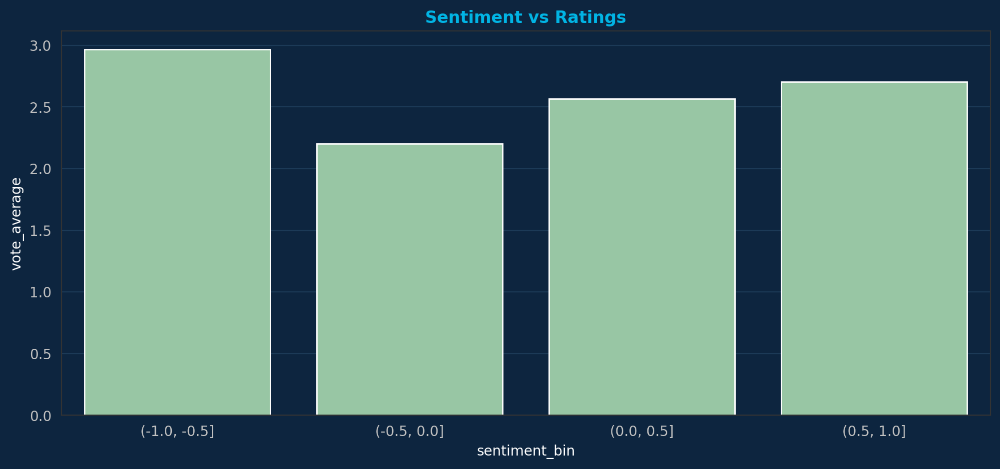

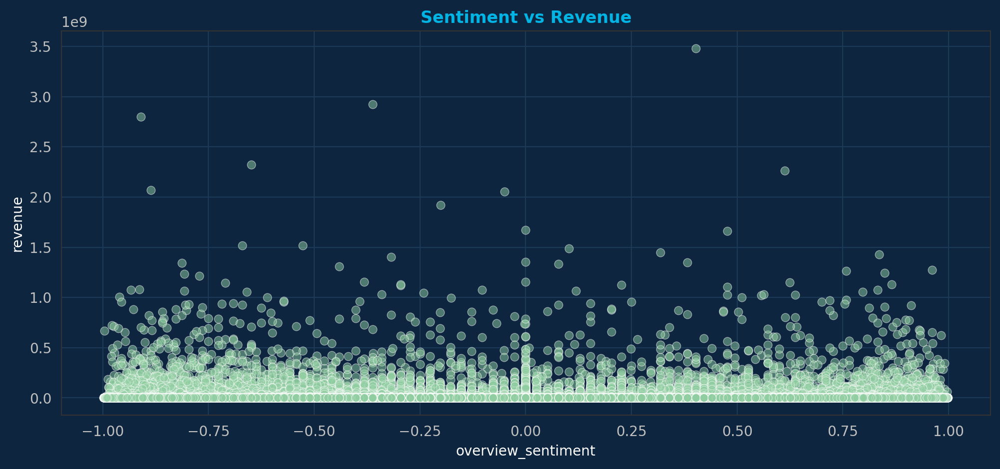

                    overview_sentiment  vote_average   revenue
overview_sentiment            1.000000     -0.023687 -0.010139
vote_average                 -0.023687      1.000000  0.070797
revenue                      -0.010139      0.070797  1.000000


In [ ]:
plt.figure(figsize=(12,5))
movies['sentiment_bin'] = pd.cut(movies['overview_sentiment'], bins=[-1,-0.5,0,0.5,1])
avg_rating = movies.groupby('sentiment_bin')['vote_average'].mean().reset_index()
plt.title("Sentiment vs Ratings")
sns.barplot(data=avg_rating, x='sentiment_bin', y='vote_average',color=TMDB_TERTIARY)


plt.figure(figsize=(12,5))
sns.scatterplot(data=movies, x='overview_sentiment', y='revenue', alpha=0.5,color=TMDB_TERTIARY)
plt.title("Sentiment vs Revenue")
plt.show()

print(movies[['overview_sentiment','vote_average','revenue']].corr())

# Machine Learning

## Blockbuster Key Features

In [23]:
import xgboost as xgb
# PHASE 1 — Feature Engineering + Model Selection

# 1. Define blockbuster label
movies_ML = movies.copy()
movies_ML["label"] = (
    (movies_ML["revenue"] > 1e8) |
    (movies_ML["ROI"] > 2) |
    ((movies_ML["popularity_norm"] > 0.7) & (movies_ML["vote_count_norm"] > 0.7))
).astype(int)

# 2. Handle NaNs
movies_ML[movies_ML.select_dtypes(include=[np.number]).columns] = \
    movies_ML.select_dtypes(include=[np.number]).fillna(0.0)
movies_ML[movies_ML.select_dtypes(exclude=[np.number]).columns] = \
    movies_ML.select_dtypes(exclude=[np.number]).fillna("")

# 3. Explode actors
movies_ML["actors"] = movies_ML["actors"].str.split(",")
movies_exploded = movies_ML.explode("actors")
movies_exploded["actors"] = movies_exploded["actors"].str.strip()

# 4. Aggregate actor stats
actor_stats = movies_exploded.groupby("actors").agg({
    "vote_average": "mean",
    "vote_count": "mean",
    "revenue": "mean",
    "ROI": "mean"
}).reset_index()

movies_exploded = movies_exploded.merge(actor_stats, on="actors", suffixes=("", "_actor"))
actor_features = movies_exploded.groupby("id").agg({
    "vote_average_actor": "mean",
    "vote_count_actor": "mean",
    "revenue_actor": "mean",
    "ROI_actor": "mean"
}).reset_index()

# 5. Aggregate director stats
director_stats = movies_ML.groupby("director").agg({
    "vote_average": "mean",
    "vote_count": "mean",
    "revenue": "mean",
    "ROI": "mean"
}).reset_index()

movies_ML = movies_ML.merge(director_stats, on="director", suffixes=("", "_director"))
movies_ML = movies_ML.merge(actor_features, on="id", how="left")
movies_ML = movies_ML.reset_index(drop=True)

# 6. Drop leakage features
leakage_features = [
    "id", "imdb_id", "revenue", "log_revenue", "revenue_norm", "revenue_std","ROI",
    "popularity", "popularity_norm", "popularity_std",
    "vote_count", "vote_count_norm", "vote_count_std"]

X = movies_ML.drop(columns=leakage_features + ["label"], errors="ignore")
X = X.select_dtypes(include=["number"]).fillna(0.0)
y = movies_ML["label"]

print("Final feature set:", X.columns.tolist())
print("Shape:", X.shape)

# 7. Single train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)
print(f"Train: {X_train.shape}, Test: {X_test.shape}")

# 8. Candidate models
models = {
    "LR":   LogisticRegression(max_iter=1000),
    "RF":   RandomForestClassifier(n_estimators=200),
    "XGB":  xgb.XGBClassifier(eval_metric="logloss"),
    "LGBM": lgb.LGBMClassifier(),
    "NN":   Sequential([
        Dense(64, activation="relu", input_shape=(X_train.shape[1],)),
        Dense(32, activation="relu"),
        Dense(1, activation="sigmoid") ])}

results = {}
for name, model in models.items():
    if name == "NN":
        model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["AUC"])
        model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
        y_prob = model.predict(X_test).flatten()
        y_pred = (y_prob > 0.5).astype(int)
    else:
        model.fit(X_train, y_train)
        y_prob = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

    results[name] = {
        "ROC-AUC": roc_auc_score(y_test, y_prob),
        "F1":      f1_score(y_test, y_pred),}

best_model_name = max(results, key=lambda k: results[k]["ROC-AUC"])
best_fitted     = models[best_model_name]
print("Best model:", best_model_name, results[best_model_name])

# 9. Blockbuster candidate pool
CANDIDATE_THRESHOLD = 0.70

if best_model_name == "NN":
    y_prob_test = best_fitted.predict(X_test).flatten()
    blockbuster_probs_full = best_fitted.predict(X).flatten()
else:
    y_prob_test = best_fitted.predict_proba(X_test)[:, 1]
    blockbuster_probs_full = best_fitted.predict_proba(X)[:, 1]

blockbuster_candidates = X_test[y_prob_test >= CANDIDATE_THRESHOLD]
movies_ML["bb_prob"] = blockbuster_probs_full

print(f"Blockbuster candidates: {len(blockbuster_candidates)}")
print(f"bb_prob scored for all {len(movies_ML)} movies")

Final feature set: ['vote_average', 'runtime', 'budget', 'budget_norm', 'budget_std', 'log_budget', 'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust', 'valence', 'arousal', 'dominance', 'release_year', 'release_quarter', 'genre_count', 'vote_average_director', 'vote_count_director', 'revenue_director', 'ROI_director', 'vote_average_actor', 'vote_count_actor', 'revenue_actor', 'ROI_actor']
Shape: (578965, 30)
Train: (463172, 30), Test: (115793, 30)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Info] Number of positive: 4152, number of negative: 459020
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6941
[LightGBM] [Info] Number of data points in the train set: 463172, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.008964 -> initscore=-4.705504
[LightGBM] [Info] Start training from score -4.705504
3619/3619 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
Best model: LGBM {'ROC-AUC': np.float64(0.9981085363313599), 'F1': 0.7382278481012658}
Blockbuster candidates: 727
bb_prob scored for all 578965 movies



  PHASE 1 — Best model: LGBM

Classification Report:
                 precision    recall  f1-score   support

Non-blockbuster       1.00      1.00      1.00    114755
    Blockbuster       0.78      0.70      0.74      1038

       accuracy                           1.00    115793
      macro avg       0.89      0.85      0.87    115793
   weighted avg       1.00      1.00      1.00    115793

ROC-AUC : 0.9981
Avg Prec: 0.8005
F1      : 0.7382

Optimal threshold (max F1): 0.280
  F1 @ optimal : 0.7540
  Precision    : 0.6931
  Recall       : 0.8266

Top 10 features:
budget                243
ROI_actor             242
ROI_director          226
revenue_director      218
vote_average          187
runtime               164
release_year          164
revenue_actor         156
dominance             105
vote_average_actor    100


/tmp/ipykernel_30991/2941168959.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


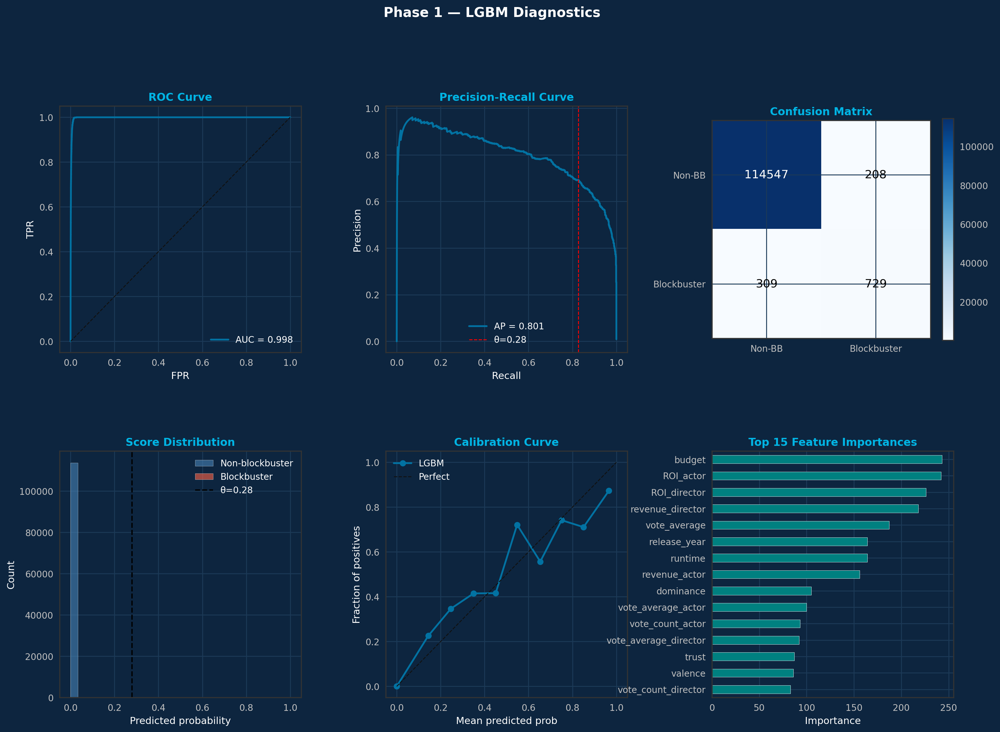

Saved: phase1_diagnostics.png
[LightGBM] [Info] Number of positive: 3321, number of negative: 367216
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.089115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6943
[LightGBM] [Info] Number of data points in the train set: 370537, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.008963 -> initscore=-4.705684
[LightGBM] [Info] Start training from score -4.705684
[LightGBM] [Info] Number of positive: 3321, number of negative: 367216
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.086128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6950
[LightGBM] [Info] Number of data points in the train set: 370537, number of used

In [24]:
# PHASE 1 - CONTINUED: Evaluation, Calibration & Candidate Export
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import (
    roc_auc_score, f1_score, r2_score,
    classification_report, confusion_matrix,
    roc_curve, precision_recall_curve, average_precision_score
)
from sklearn.inspection import permutation_importance

# 1. Re-train best model with probability support
print(f"  PHASE 1 — Best model: {best_model_name}")
# Map name -> unfitted estimator for calibration
_model_map = {
    "LR":   LogisticRegression(max_iter=1000),
    "RF":   RandomForestClassifier(n_estimators=200),
    "XGB":  xgb.XGBClassifier(eval_metric="logloss"),
    "LGBM": lgb.LGBMClassifier(),
}

# Pull the already-fitted model from the loop
fitted_best = models[best_model_name]

# Get probability scores (NN handled separately)
if best_model_name == "NN":
    y_prob_test  = fitted_best.predict(X_test).flatten()
    y_prob_train = fitted_best.predict(X_train).flatten()
else:
    y_prob_test  = fitted_best.predict_proba(X_test)[:, 1]
    y_prob_train = fitted_best.predict_proba(X_train)[:, 1]

# 2. Full evaluation report
THRESHOLD = 0.50   # decision threshold (tune below if needed)

y_pred_thresh = (y_prob_test >= THRESHOLD).astype(int)

print("Classification Report:")
print(classification_report(y_test, y_pred_thresh, target_names=["Non-blockbuster", "Blockbuster"]))

cm = confusion_matrix(y_test, y_pred_thresh)
roc_auc  = roc_auc_score(y_test, y_prob_test)
ap_score = average_precision_score(y_test, y_prob_test)
f1       = f1_score(y_test, y_pred_thresh)

print(f"ROC-AUC : {roc_auc:.4f}")
print(f"Avg Prec: {ap_score:.4f}")
print(f"F1      : {f1:.4f}")

# 3. Threshold optimisation (maximise F1 on test set)
precisions, recalls, pr_thresholds = precision_recall_curve(y_test, y_prob_test)
f1_scores_thresh = 2 * precisions * recalls / (precisions + recalls + 1e-9)
best_thresh_idx  = np.argmax(f1_scores_thresh[:-1])   # last element has no threshold
BEST_THRESHOLD   = pr_thresholds[best_thresh_idx]

print(f"\nOptimal threshold (max F1): {BEST_THRESHOLD:.3f}")
print(f"  F1 @ optimal : {f1_scores_thresh[best_thresh_idx]:.4f}")
print(f"  Precision    : {precisions[best_thresh_idx]:.4f}")
print(f"  Recall       : {recalls[best_thresh_idx]:.4f}")

# 4. Feature importance
if best_model_name in ("RF", "XGB", "LGBM"):
    feat_imp = pd.Series(
        fitted_best.feature_importances_,
        index=X.columns
    ).sort_values(ascending=False)
else:
    # Permutation importance for LR / NN
    perm = permutation_importance(
        fitted_best, X_test, y_test,
        n_repeats=10, random_state=42, scoring="roc_auc"
    ) if best_model_name == "LR" else None

    if perm is not None:
        feat_imp = pd.Series(perm.importances_mean, index=X.columns).sort_values(ascending=False)
    else:
        feat_imp = pd.Series(dtype=float)   # NN - skip

top_features = feat_imp.head(20) if len(feat_imp) else None
print("\nTop 10 features:")
print(feat_imp.head(10).to_string())

#  5. Diagnostic plots
fig = plt.figure(figsize=(18, 12))
fig.suptitle(f"Phase 1 — {best_model_name} Diagnostics", fontsize=15, fontweight="bold", y=1.01)
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.35)

# 5a. ROC curve
ax_roc = fig.add_subplot(gs[0, 0])
fpr, tpr, _ = roc_curve(y_test, y_prob_test)
ax_roc.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
ax_roc.plot([0,1],[0,1], "k--", lw=1)
ax_roc.set_xlabel("FPR"); ax_roc.set_ylabel("TPR")
ax_roc.set_title("ROC Curve"); ax_roc.legend()

# 5b. Precision-Recall curve
ax_pr = fig.add_subplot(gs[0, 1])
ax_pr.plot(recalls[:-1], precisions[:-1], lw=2, label=f"AP = {ap_score:.3f}")
ax_pr.axvline(recalls[best_thresh_idx], color="red", linestyle="--", lw=1, label=f"θ={BEST_THRESHOLD:.2f}")
ax_pr.set_xlabel("Recall"); ax_pr.set_ylabel("Precision")
ax_pr.set_title("Precision-Recall Curve"); ax_pr.legend()

# 5c. Confusion matrix
ax_cm = fig.add_subplot(gs[0, 2])
im = ax_cm.imshow(cm, cmap="Blues")
ax_cm.set_xticks([0,1]); ax_cm.set_yticks([0,1])
ax_cm.set_xticklabels(["Non-BB","Blockbuster"])
ax_cm.set_yticklabels(["Non-BB","Blockbuster"])
for i in range(2):
    for j in range(2):
        ax_cm.text(j, i, str(cm[i,j]), ha="center", va="center",
                   color="white" if cm[i,j] > cm.max()/2 else "black", fontsize=13)
ax_cm.set_title("Confusion Matrix"); fig.colorbar(im, ax=ax_cm, fraction=0.046)

# 5d. Score distribution
ax_dist = fig.add_subplot(gs[1, 0])
ax_dist.hist(y_prob_test[y_test==0], bins=30, alpha=0.6, label="Non-blockbuster", color="steelblue")
ax_dist.hist(y_prob_test[y_test==1], bins=30, alpha=0.6, label="Blockbuster",     color="tomato")
ax_dist.axvline(BEST_THRESHOLD, color="black", linestyle="--", lw=1.5, label=f"θ={BEST_THRESHOLD:.2f}")
ax_dist.set_xlabel("Predicted probability"); ax_dist.set_ylabel("Count")
ax_dist.set_title("Score Distribution"); ax_dist.legend()

# 5e. Calibration curve
ax_cal = fig.add_subplot(gs[1, 1])
prob_true, prob_pred = calibration_curve(y_test, y_prob_test, n_bins=10)
ax_cal.plot(prob_pred, prob_true, marker="o", lw=2, label=best_model_name)
ax_cal.plot([0,1],[0,1], "k--", lw=1, label="Perfect")
ax_cal.set_xlabel("Mean predicted prob"); ax_cal.set_ylabel("Fraction of positives")
ax_cal.set_title("Calibration Curve"); ax_cal.legend()

# 5f. Feature importance (top 15)
ax_fi = fig.add_subplot(gs[1, 2])
if top_features is not None and len(top_features) > 0:
    top_features.head(15).sort_values().plot(kind="barh", ax=ax_fi, color="teal")
    ax_fi.set_title("Top 15 Feature Importances")
    ax_fi.set_xlabel("Importance")
else:
    ax_fi.text(0.5, 0.5, "N/A for NN", ha="center", va="center")
    ax_fi.set_title("Feature Importances")

plt.tight_layout()
plt.savefig("phase1_diagnostics.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: phase1_diagnostics.png")

# 6. Calibrate model for reliable probabilities
if best_model_name != "NN":
    calibrated = CalibratedClassifierCV(
        _model_map[best_model_name], cv=5, method="isotonic"
    )
    calibrated.fit(X_train, y_train)
    y_prob_cal = calibrated.predict_proba(X_test)[:, 1]
    print(f"\nCalibrated ROC-AUC: {roc_auc_score(y_test, y_prob_cal):.4f}")
else:
    calibrated  = fitted_best     # NN already outputs probabilities
    y_prob_cal  = y_prob_test

# 7. Tag ALL movies with blockbuster probability
# Re-score on FULL feature set (train+test combined)
X_full = X.copy()

if best_model_name != "NN":
    movies_ML["bb_prob"] = calibrated.predict_proba(X_full)[:, 1]
else:
    movies_ML["bb_prob"] = fitted_best.predict(X_full).flatten()

movies_ML["bb_pred"] = (movies_ML["bb_prob"] >= BEST_THRESHOLD).astype(int)

# 8. Blockbuster candidate pool
CANDIDATE_THRESHOLD = 0.70   # higher bar for "strong blockbuster signal"

blockbuster_candidates = (
    movies_ML[movies_ML["bb_prob"] >= CANDIDATE_THRESHOLD]
    .sort_values("bb_prob", ascending=False)
    .reset_index(drop=True)
)

print(f"  Blockbuster candidates (prob ≥ {CANDIDATE_THRESHOLD}): {len(blockbuster_candidates)}")

# Columns to surface
display_cols = [c for c in [
    "title", "release_year", "genres", "director",
    "budget", "revenue", "ROI",
    "vote_average", "popularity",
    "bb_prob", "label"
] if c in blockbuster_candidates.columns]

print(blockbuster_candidates[display_cols].head(20).to_string(index=False))

# 9. Export candidate pool for Phase 2
blockbuster_candidates.to_csv("/content/drive/MyDrive/kaggle_datasets/blockbuster_candidates_phase1.csv", index=False)
movies_ML[["id", "bb_prob", "bb_pred"] +
          [c for c in ["title","label"] if c in movies_ML.columns]
         ].to_csv("all_movies_scored_phase1.csv", index=False)

print("\nExported:")
print("  blockbuster_candidates_phase1.csv  — high-confidence pool")
print("  all_movies_scored_phase1.csv       — full scored dataset")

#  10. Phase 1 summary
print(f"""
              PHASE 1 COMPLETE — SUMMARY
  Best model       : {best_model_name:<38}
  ROC-AUC          : {roc_auc:<38.4f}
  Avg Precision    : {ap_score:<38.4f}
  F1 (optimal θ)   : {f1_scores_thresh[best_thresh_idx]:<38.4f}
  Optimal threshold: {BEST_THRESHOLD:<38.3f}
  Candidates (≥.70): {len(blockbuster_candidates):<38}
""")

## Movie Recommendation System

In [25]:
# PHASE 2 — User-Input Recommendation System
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense  # add Input here

# --- 1. Sentiment embedding (unchanged) ---
sentiment_cols = [
    "anger","anticipation","disgust","fear","joy",
    "negative","positive","sadness","surprise","trust",
    "valence","arousal","dominance"
]

X_sentiment = movies_ML[sentiment_cols].fillna(0.0)
scaler = StandardScaler()
X_sentiment_scaled = scaler.fit_transform(X_sentiment)

# Use Input() layer instead of input_shape argument
inputs = Input(shape=(X_sentiment_scaled.shape[1],))
encoded = Dense(32, activation="relu")(inputs)
encoded = Dense(16, activation="relu")(encoded)   # bottleneck
decoded = Dense(32, activation="relu")(encoded)
decoded = Dense(X_sentiment_scaled.shape[1], activation="linear")(decoded)

autoencoder = Model(inputs=inputs, outputs=decoded)
autoencoder.compile(optimizer="adam", loss="mse")
autoencoder.fit(X_sentiment_scaled, X_sentiment_scaled,
                epochs=20, batch_size=32, verbose=0)

# Encoder is now a clean separate model, no layer indexing needed
encoder = Model(inputs=inputs, outputs=encoded)
movie_embeddings = encoder.predict(X_sentiment_scaled)
movies_ML["embedding_idx"] = range(len(movies_ML))
print(f"Embeddings ready: {movie_embeddings.shape}")  # (n_movies, 16)

# 2. Recommendation function
def recommend(
    favourite_titles: list,       # e.g. ["Inception", "Interstellar"]
    preferred_genres: list = None, # e.g. ["Action", "Sci-Fi"]  — optional
    alpha: float = 0.6,            # sentiment weight vs blockbuster weight
    top_n: int = 10,
    min_bb_prob: float = 0.0,      # optional: only return blockbuster-tier films
):
    # Validate titles
    valid_mask  = movies_ML["title"].isin(favourite_titles)
    valid_titles = movies_ML[valid_mask]["title"].tolist()
    missing      = set(favourite_titles) - set(valid_titles)

    if missing:
        print(f"Not found in dataset: {missing}")
    if not valid_titles:
        print("No valid titles found. Check spelling.")
        return None

    print(f"Building profile from: {valid_titles}")

    # Build user vector from favourites
    fav_indices = movies_ML[valid_mask]["embedding_idx"].values
    user_vector = movie_embeddings[fav_indices].mean(axis=0)

    # Compute sentiment similarity across all movies
    similarities = cosine_similarity([user_vector], movie_embeddings)[0]
    movies_ML["sentiment_score"] = similarities

    #Hybrid score
    movies_ML["final_score"] = (
        alpha       * movies_ML["sentiment_score"] +
        (1 - alpha) * movies_ML["bb_prob"])

    # Filter out input movies
    results = movies_ML[~movies_ML["title"].isin(favourite_titles)].copy()

    #  Genre filter (optional)
    if preferred_genres:
        genre_pattern = "|".join(preferred_genres)
        results = results[
            results["genres"].str.contains(genre_pattern, case=False, na=False)
        ]
        print(f"Genre filter applied: {preferred_genres} → {len(results)} candidates")

    # Blockbuster filter (optional)
    if min_bb_prob > 0:
        results = results[results["bb_prob"] >= min_bb_prob]
        print(f"Blockbuster filter (≥{min_bb_prob}): {len(results)} candidates")

    # -- Sort and return --
    results = results.sort_values("final_score", ascending=False).reset_index(drop=True)

    display_cols = [c for c in [
        "title", "release_year", "genres",
        "vote_average", "sentiment_score", "bb_prob", "final_score"] if c in results.columns]
    return results[display_cols].head(top_n)

18093/18093 ━━━━━━━━━━━━━━━━━━━━ 24s 1ms/step
Embeddings ready: (578965, 16)


Enter your favourite movies (comma-separated):
Your favourites: Inception

Enter preferred genres (comma-separated), or press Enter to skip:
Preferred genres: Science Fiction

Only show blockbuster-tier films? (y/n):
Blockbusters only: y

How many recommendations? (default 10):
Top N: 6

Building profile from: ['Inception']
Genre filter applied: ['Science Fiction'] → 14591 candidates
Blockbuster filter (≥0.7): 328 candidates
                               title  release_year  \
0                         Armageddon          1998   
1                 Sonic the Hedgehog          2020   
2             Avengers: Infinity War          2018   
3                       Transformers          2007   
4  Spider-Man: Into the Spider-Verse          2018   
5                       The Avengers          2012   

                                          genres  vote_average  \
0   Action, Thriller, Science Fiction, Adventure         6.829   
1        Action, Science Fiction, Comedy, Family         7.3

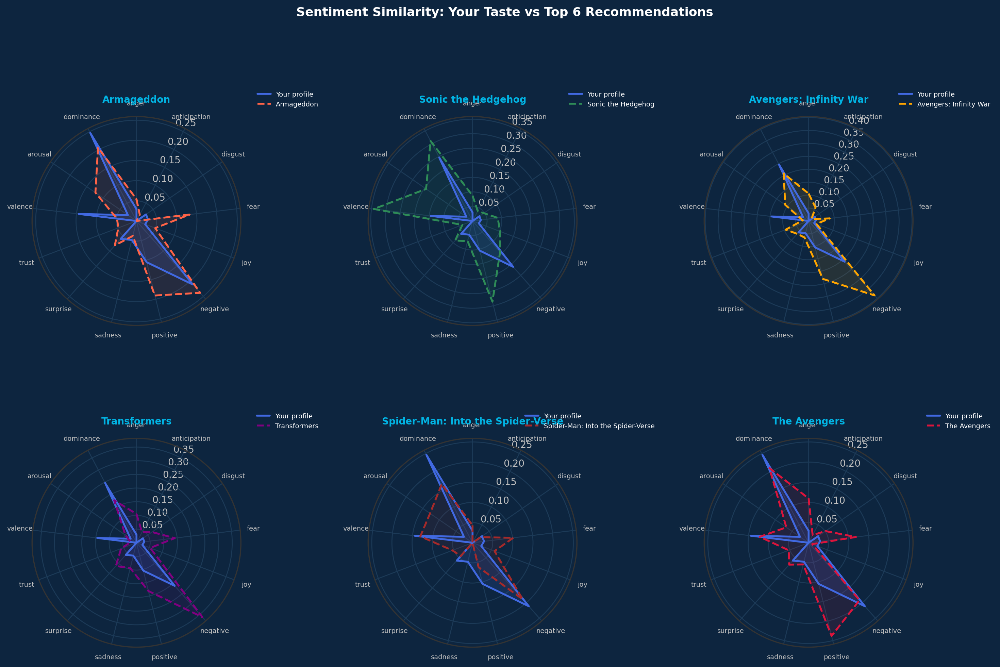

Saved: radar_charts.png


In [27]:
# 3. User Input
print("Enter your favourite movies (comma-separated):")
raw_titles = input("Your favourites: ")
favourite_titles = [t.strip() for t in raw_titles.split(",")]

print("\nEnter preferred genres (comma-separated), or press Enter to skip:")
raw_genres = input("Preferred genres: ")
preferred_genres = [g.strip() for g in raw_genres.split(",")] if raw_genres.strip() else None

print("\nOnly show blockbuster-tier films? (y/n):")
min_bb_prob = 0.70 if input("Blockbusters only: ").strip().lower() == "y" else 0.0

print("\nHow many recommendations? (default 10):")
top_n_input = input("Top N: ").strip()
top_n = int(top_n_input) if top_n_input.isdigit() else 10

# --- 4. Run ---
print("\n" + "="*50)
results = recommend(
    favourite_titles=favourite_titles,
    preferred_genres=preferred_genres,
    min_bb_prob=min_bb_prob,
    top_n=top_n
)
print(results)

# 5. Radar Chart: One per Recommended Movie
import math
import matplotlib.pyplot as plt
import numpy as np

def plot_radar(input_titles, recommended_df, top_n_radar=5):
    categories = sentiment_cols
    N = len(categories)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    # Build input profile once
    input_mask  = movies_ML["title"].isin(input_titles)
    input_data  = movies_ML[input_mask][sentiment_cols].mean(axis=0).values.tolist()
    input_data += input_data[:1]

    top_recs = recommended_df.head(top_n_radar)
    n_plots  = len(top_recs)

    # Grid layout
    n_cols = min(3, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 5 * n_rows),
        subplot_kw=dict(polar=True))

    # flatten to 1D for easy indexing
    axes = np.array(axes).flatten()

    # hide empty subplots
    for j in range(n_plots, len(axes)):
        fig.delaxes(axes[j])

    colors = ["tomato", "seagreen", "orange", "purple", "brown",
              "crimson", "teal", "goldenrod", "slateblue", "coral"]

    for i, (_, row) in enumerate(top_recs.iterrows()):
        ax    = axes[i]
        title = row["title"]
        color = colors[i % len(colors)]

        # Get recommended movie sentiment
        movie_row = movies_ML[movies_ML["title"] == title]
        if movie_row.empty:
            ax.set_title(f"{title}\n(no data)", size=9)
            continue

        values  = movie_row[sentiment_cols].values[0].tolist()
        values += values[:1]

        # Plot input profile
        ax.plot(angles, input_data, linewidth=2, linestyle="solid",
                label="Your profile", color="royalblue")
        ax.fill(angles, input_data, alpha=0.15, color="royalblue")

        # Plot recommended movie
        ax.plot(angles, values, linewidth=2, linestyle="--",
                label=title, color=color)
        ax.fill(angles, values, alpha=0.10, color=color)

        # Formatting
        ax.set_theta_offset(np.pi / 2)
        ax.set_theta_direction(-1)
        ax.set_thetagrids(np.degrees(angles[:-1]), categories, fontsize=7)
        ax.set_title(title, size=10, fontweight="bold", pad=15)
        ax.legend(loc="upper right", bbox_to_anchor=(1.4, 1.15), fontsize=7)

    fig.suptitle(
        f"Sentiment Similarity: Your Taste vs Top {n_plots} Recommendations",
        fontsize=13, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig("radar_charts.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: radar_charts.png")

# Run
if results is not None:
    plot_radar(favourite_titles, results, top_n_radar=top_n)